<h1><span style='font-family: "Trebuchet MS", Helvetica, sans-serif;'>Automatic Ticket Classification - EDA
</span></h1>

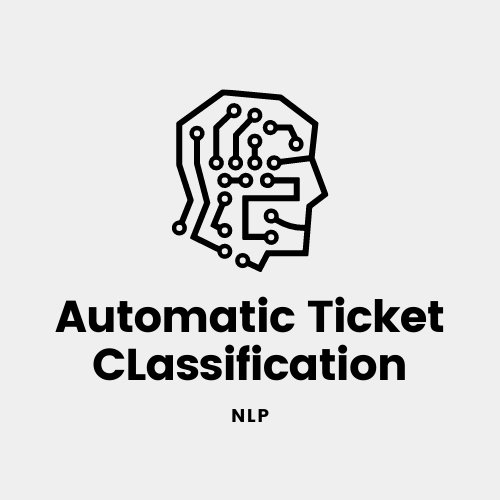

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# imports

import os
import math
import xlrd
import hjson
import random
import warnings
from time import time
from pathlib import Path
import pandas as pd, numpy as np
from pprint import pprint
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from collections import defaultdict, Counter
from wordcloud import WordCloud, STOPWORDS
from ftfy import fix_text
from sklearn.preprocessing import LabelEncoder
import tensorflow
from utils.utils import load_hjson
config = load_hjson(Path('./config/config.hjson'))

tqdm.pandas()
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)
%matplotlib inline

C:\Users\surya\anaconda3\envs\full\lib\site-packages\tqdm\std.py:697: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [3]:
# reproducibility
seed = 7
random.seed(seed)
tensorflow.random.set_seed(seed)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Import & Analyse the data.</span></strong></li>
</ul></h3>

In [4]:
# check encoding
with open('./data/input_data.xlsx', 'r') as fp:
    print(fp)

<_io.TextIOWrapper name='./data/input_data.xlsx' mode='r' encoding='cp1252'>


In [5]:
wb = xlrd.open_workbook('./data/input_data.xlsx', encoding_override='cp1252')
dataset = pd.read_excel(wb)
dataset.sample(7)

,Short description,Description,Caller,Assignment group
1093,"assign user ""corsthroc34"" to the ad ltabthrysa...","hello, \npls assign user ""corsthroc34"" to the ...",xfdkwusj gyklresa,GRP_2
3037,netweaver access,\r\n\r\nreceived from: oqvwgnkc.gkjylpzx@gmail...,oqvwgnkc gkjylpzx,GRP_0
7863,unable to install engineering_tool,unable to install engineering_tool,anpocezt qturbxsg,GRP_0
3565,probleme mit erpgui \jionmpsf wnkpzcmv,probleme mit erpgui \jionmpsf wnkpzcmv,jionmpsf wnkpzcmv,GRP_24
4682,erp crm - instatnt timeout,user: fywphaxc.jacdqbks@gmail.com;\r\nissue: u...,fywphaxc jacdqbks,GRP_15
5563,please assist erp log on need to be reset. not...,\n\nreceived from: gvderpbx.udrzjxkm@gmail.com...,gvderpbx udrzjxkm,GRP_0
5794,re: ticket_no1538811::company center authoriza...,\r\n\r\nreceived from: zdnqowag.cdtyonhw@gmail...,zdnqowag cdtyonhw,GRP_0


In [6]:
dataset.shape  # very small dataset with only 8500 rows

(8500, 4)

In [7]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8492 non-null   object
 1   Description        8499 non-null   object
 2   Caller             8500 non-null   object
 3   Assignment group   8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


In [8]:
# rename column names for convenience
dataset = dataset.rename(columns={
    "Short description": "short_description",
    "Description": "description",
    "Caller": "caller",
    "Assignment group": "group"
    })

In [9]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   short_description  8492 non-null   object
 1   description        8499 non-null   object
 2   caller             8500 non-null   object
 3   group              8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


In [10]:
np.unique(dataset.group), len(np.unique(dataset.group))  # 74 different functional groups

(array(['GRP_0', 'GRP_1', 'GRP_10', 'GRP_11', 'GRP_12', 'GRP_13', 'GRP_14',
        'GRP_15', 'GRP_16', 'GRP_17', 'GRP_18', 'GRP_19', 'GRP_2',
        'GRP_20', 'GRP_21', 'GRP_22', 'GRP_23', 'GRP_24', 'GRP_25',
        'GRP_26', 'GRP_27', 'GRP_28', 'GRP_29', 'GRP_3', 'GRP_30',
        'GRP_31', 'GRP_32', 'GRP_33', 'GRP_34', 'GRP_35', 'GRP_36',
        'GRP_37', 'GRP_38', 'GRP_39', 'GRP_4', 'GRP_40', 'GRP_41',
        'GRP_42', 'GRP_43', 'GRP_44', 'GRP_45', 'GRP_46', 'GRP_47',
        'GRP_48', 'GRP_49', 'GRP_5', 'GRP_50', 'GRP_51', 'GRP_52',
        'GRP_53', 'GRP_54', 'GRP_55', 'GRP_56', 'GRP_57', 'GRP_58',
        'GRP_59', 'GRP_6', 'GRP_60', 'GRP_61', 'GRP_62', 'GRP_63',
        'GRP_64', 'GRP_65', 'GRP_66', 'GRP_67', 'GRP_68', 'GRP_69',
        'GRP_7', 'GRP_70', 'GRP_71', 'GRP_72', 'GRP_73', 'GRP_8', 'GRP_9'],
       dtype=object),
 74)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Check for Incomplete Information</span></strong></li>
</ul></h3>

In [11]:
dataset.isna().sum()  # Few missing values

short_description    8
description          1
caller               0
group                0
dtype: int64

In [12]:
dataset[dataset.isna().any(axis=1)]  # check rows with missing values

,short_description,description,caller,group
2604,NaN,\r\n\r\nreceived from: ohdrnswl.rezuibdt@gmail...,ohdrnswl rezuibdt,GRP_34
3383,NaN,\r\n-connected to the user system using teamvi...,qftpazns fxpnytmk,GRP_0
3906,NaN,-user unable tologin to vpn.\r\n-connected to...,awpcmsey ctdiuqwe,GRP_0
3910,NaN,-user unable tologin to vpn.\r\n-connected to...,rhwsmefo tvphyura,GRP_0
3915,NaN,-user unable tologin to vpn.\r\n-connected to...,hxripljo efzounig,GRP_0
3921,NaN,-user unable tologin to vpn.\r\n-connected to...,cziadygo veiosxby,GRP_0
3924,NaN,name:wvqgbdhm fwchqjor\nlanguage:\nbrowser:mic...,wvqgbdhm fwchqjor,GRP_0
4341,NaN,\r\n\r\nreceived from: eqmuniov.ehxkcbgj@gmail...,eqmuniov ehxkcbgj,GRP_0
4395,i am locked out of skype,NaN,viyglzfo ajtfzpkb,GRP_0


In [13]:
dataset.loc[dataset['description'].isna()]

,short_description,description,caller,group
4395,i am locked out of skype,NaN,viyglzfo ajtfzpkb,GRP_0


In [14]:
dataset.iloc[4395]

short_description    i am locked out of skype
description                               NaN
caller                      viyglzfo ajtfzpkb
group                                   GRP_0
Name: 4395, dtype: object

In [15]:
# imputing the short description by value in description and vice-versa
# However, If both columns were missing, we would have to drop the row
dataset.loc[dataset['description'].isna(), 'description']  = dataset.loc[dataset['description'].isna()].short_description

In [16]:
dataset.loc[dataset['short_description'].isna()]

,short_description,description,caller,group
2604,NaN,\r\n\r\nreceived from: ohdrnswl.rezuibdt@gmail...,ohdrnswl rezuibdt,GRP_34
3383,NaN,\r\n-connected to the user system using teamvi...,qftpazns fxpnytmk,GRP_0
3906,NaN,-user unable tologin to vpn.\r\n-connected to...,awpcmsey ctdiuqwe,GRP_0
3910,NaN,-user unable tologin to vpn.\r\n-connected to...,rhwsmefo tvphyura,GRP_0
3915,NaN,-user unable tologin to vpn.\r\n-connected to...,hxripljo efzounig,GRP_0
3921,NaN,-user unable tologin to vpn.\r\n-connected to...,cziadygo veiosxby,GRP_0
3924,NaN,name:wvqgbdhm fwchqjor\nlanguage:\nbrowser:mic...,wvqgbdhm fwchqjor,GRP_0
4341,NaN,\r\n\r\nreceived from: eqmuniov.ehxkcbgj@gmail...,eqmuniov ehxkcbgj,GRP_0


In [17]:
dataset.loc[dataset['short_description'].isna(), 'short_description']  = dataset.loc[dataset['short_description'].isna()].description

In [18]:
dataset.isna().sum()  # all missing values imputed

short_description    0
description          0
caller               0
group                0
dtype: int64

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Target Class Distribution</span></strong></li>
</ul></h3>

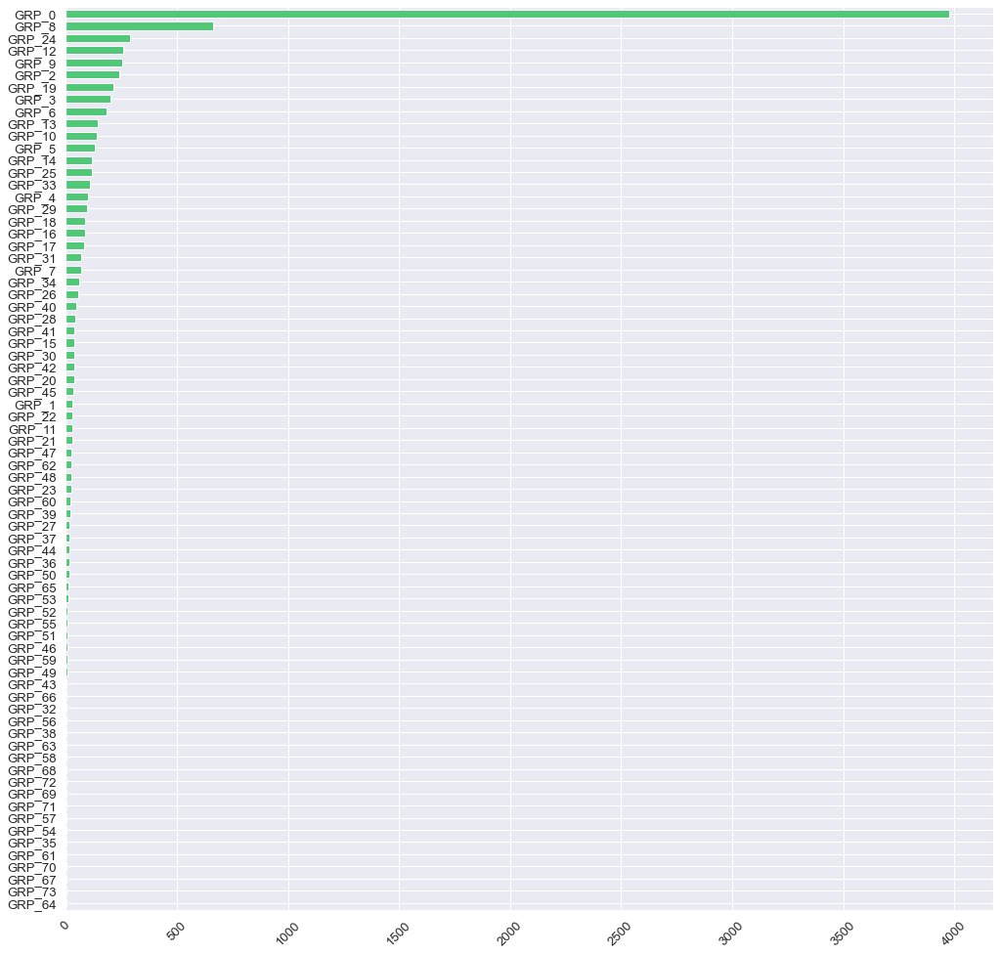

In [19]:
sns.set(font_scale=1.2)  # scale up font size
dataset.group.value_counts().sort_values(ascending=True).plot(kind='barh', width=0.65, figsize=(17, 17), color='#50C878')
plt.xticks(rotation=45)
plt.show()

In [20]:
dataset.group.value_counts().sort_values(ascending=False).tail(30)  # few classes with only single-digit datapoints

GRP_44    15
GRP_36    15
GRP_50    14
GRP_65    11
GRP_53    11
GRP_52     9
GRP_55     8
GRP_51     8
GRP_46     6
GRP_59     6
GRP_49     6
GRP_43     5
GRP_66     4
GRP_32     4
GRP_56     3
GRP_38     3
GRP_63     3
GRP_58     3
GRP_68     3
GRP_72     2
GRP_69     2
GRP_71     2
GRP_57     2
GRP_54     2
GRP_35     1
GRP_61     1
GRP_70     1
GRP_67     1
GRP_73     1
GRP_64     1
Name: group, dtype: int64

In [21]:
dataset[dataset.group == 'GRP_70']  # small groups have to merged into a separate "Others" category
dataset[dataset.group == 'GRP_70'].description.tolist()[0]

'an e-mail from  it training has email hints and tips #1.  under "create signature" it has a link "company formatheywting standard" that i am forbidden to see.\n615'

<h5><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>The target class distribution is heavily imbalanced as most calls are assinged to Group 0 and exluding this as well, we find an imabalanced dataset for the rest of the groups.
 </span></ul></h5>

In [22]:
temp = dataset.copy(deep=True)
temp.loc[temp["group"] != 'GRP_0', 'group'] = 'Other'
temp.loc[temp["group"] == 'GRP_0', "group"] = 'Group 0'

In [23]:
temp.group.value_counts()

Other      4524
Group 0    3976
Name: group, dtype: int64

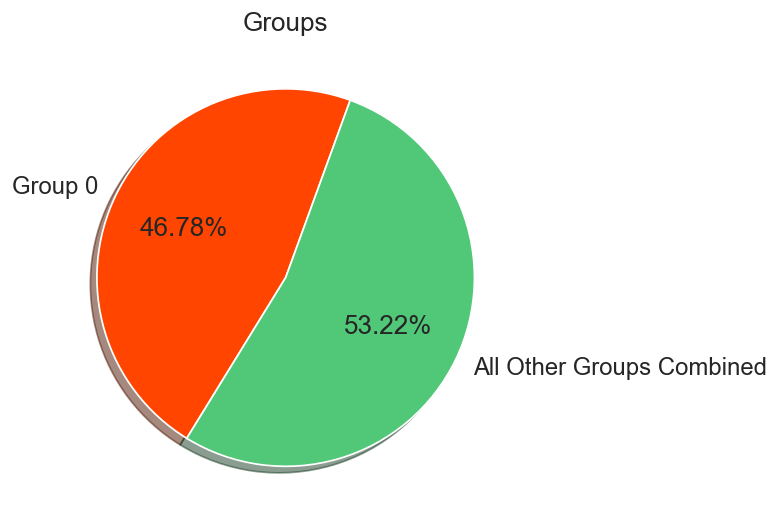

In [24]:
sns.set(font_scale=1.25)  # scale up font size

plt.figure(figsize=(5, 5), dpi=125)
group_0 = len(temp[temp['group'] == 'Group 0'])
others = len(temp[temp['group'] == 'Other'])

plt.pie(x=[group_0, others],
        explode=(0, 0),
        labels=['Group 0', 'All Other Groups Combined'],
        autopct='%1.2f%%',
        shadow=True,
        startangle=70,
        colors=['#FF4500', '#50C878'])

fig = plt.gcf()
fig.set_size_inches(5, 5)
plt.title('Groups')
plt.show()

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Choosing a Metric to benchmark model performance</span></strong></li>
</ul></h3>

* This is a multi-class classification problem, where the machine learning model will try to predict if each row is one of the 74 possibilities.
* The majority class is GRP_0, which occurs in 46.78% of the observations.

* The most common metrics for a multi-class classification problem are AUC, F1-score and accuracy.
* Accuracy is not suitable for an imbalanced classification problem. (Note that a model that always predicts GRP_0, will get an accuracy of 46.78%)
* We would choose F1-score if the majority class is more important than the smaller classes.
* We would choose AUC if we also care about the smaller classes.

#### As we want to be able to classify the tickets into all functional groups and functional groups are given equal importance, we choose AUC as the final metric to score model performance.

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Outlier Analysis</span></strong></li>
</ul></h3>

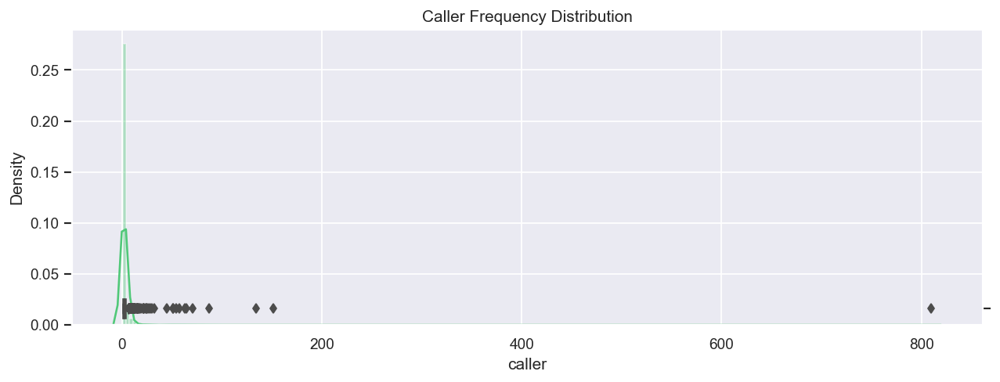

In [25]:
# plotting caller frequency counts
sns.set()
plt.figure(figsize=(12, 4), dpi=125)
ax = sns.distplot(dataset.caller.value_counts(), bins=250, kde=True, color='#50C878')
ax_ = ax.twinx()
sns.boxplot(dataset.caller.value_counts(), color='#FF4500')
ax_.set(ylim=(-.7, 12))
plt.title('Caller Frequency Distribution')
plt.show()

In [26]:
dataset[dataset.caller == 'bpctwhsn kzqsbmtp'].group.value_counts()  # most frequent caller

GRP_8     362
GRP_9     153
GRP_5      96
GRP_6      89
GRP_10     60
GRP_60     16
GRP_12      8
GRP_45      7
GRP_1       6
GRP_13      4
GRP_18      3
GRP_47      2
GRP_57      1
GRP_14      1
GRP_29      1
GRP_44      1
Name: group, dtype: int64

In [27]:
dataset[dataset.caller == 'bpctwhsn kzqsbmtp']  # job failure alerts

,short_description,description,caller,group
47,job Job_1424 failed in job_scheduler at: 10/31...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_6
50,job mm_zscr0099_dly_merktc3 failed in job_sche...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_8
59,job mm_zscr0099_dly_merktc2 failed in job_sche...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_8
60,job Job_3181 failed in job_scheduler at: 10/31...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_8
67,job Job_1338 failed in job_scheduler at: 10/31...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_9
...,...,...,...,...
7053,job Job_1387 failed in job_scheduler at: 08/18...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_9
7059,job Job_2063b failed in job_scheduler at: 08/1...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_6
7074,job HostName_1019fail failed in job_scheduler ...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_8
7076,job HostName_1019fail failed in job_scheduler ...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_8


In [28]:
def get_length(row):
    try:
        row['char_length'] = len(row.description)
        row['word_length'] = len(row.description.split())
        row['short_char_length'] = len(row.short_description)
        row['short_word_length'] = len(row.short_description.split())
    except Exception:  # assign 0 length to missing rows if any
        row['char_length'] = 0
        row['word_length'] = 0
        row['short_char_length'] = 0
        row['short_word_length'] = 0
    return row

dataset = dataset.progress_apply(get_length, axis=1)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8500/8500 [00:30<00:00, 277.44it/s]


In [29]:
dataset.sample(7)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
3526,password reset - erp SID_34,reset the erp SID_34 password as marcel had is...,yszectoh kqwljchg,GRP_0,122,17,27,5
2919,erp SID_34 password locked,erp SID_34 password locked,advqtkeu uypkfisq,GRP_0,26,4,26,4
4049,job hr_payroll_na_u6 failed in job_scheduler a...,received from: monitoring_tool@company.com\r\n...,bpctwhsn kzqsbmtp,GRP_10,114,11,70,8
7240,connecting with erp not possible,\r\n\r\nreceived from: yfmaqovp.wdonhbez@gmail...,yfmaqovp wdonhbez,GRP_0,236,26,32,5
4708,password reset collaboration_platform problem,\r\n\r\nreceived from: sbgvrncj.idfhtoqv@gmail...,sbgvrncj idfhtoqv,GRP_0,486,63,45,4
6278,pc probleme urgent,\n\nreceived from: eluvxqhw.gpbfkqeu@gmail.com...,eluvxqhw gpbfkqeu,GRP_0,1318,151,18,3
3873,request,\n\nreceived from: yxliakph.soucfnqe@gmail.com...,yxliakph soucfnqe,GRP_0,176,25,7,1


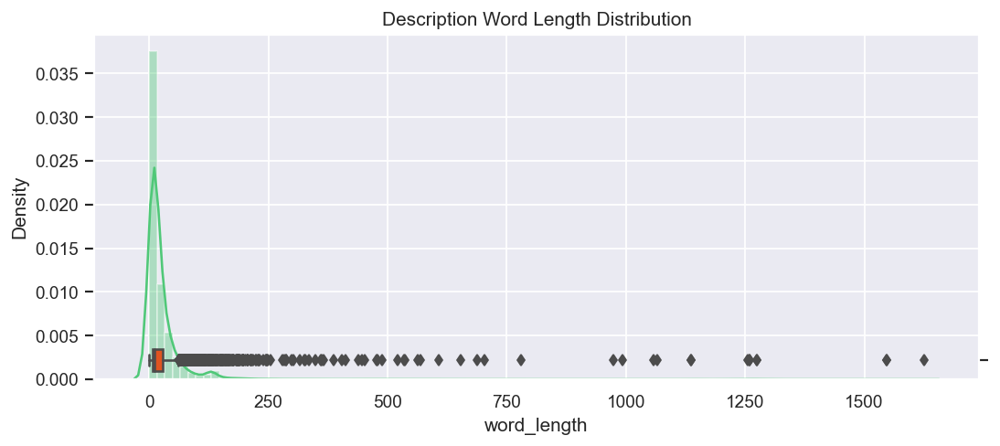

In [30]:
sns.set()
plt.figure(figsize=(10, 4), dpi=125)
ax = sns.distplot(dataset.word_length, bins=100, kde=True, color='#50C878')
ax_ = ax.twinx()
sns.boxplot(dataset.word_length, color='#FF4500')
ax_.set(ylim=(-.7, 12))
plt.title('Description Word Length Distribution')
plt.show()

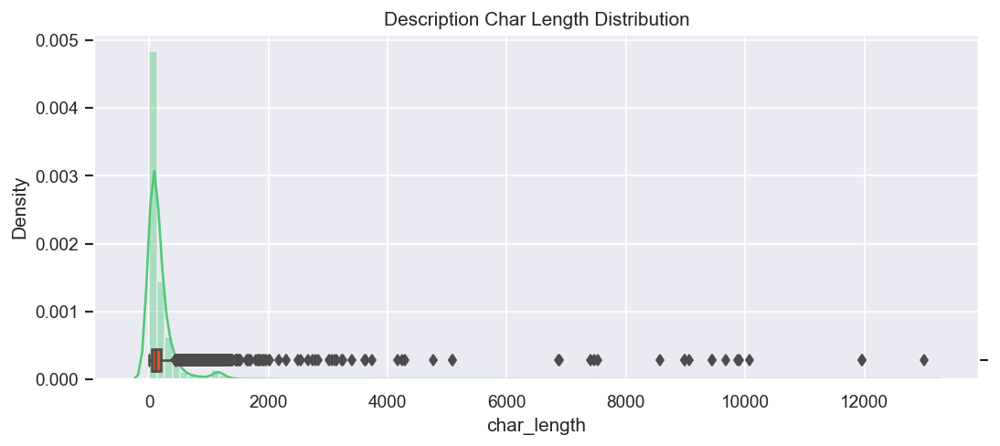

In [31]:
sns.set()
plt.figure(figsize=(10, 4), dpi=125)
ax = sns.distplot(dataset.char_length, bins=100, kde=True, color='#50C878')
ax_ = ax.twinx()
sns.boxplot(dataset.char_length, color='#FF4500')
ax_.set(ylim=(-.7, 12))
plt.title('Description Char Length Distribution')
plt.show()

In [32]:
dataset[dataset.word_length == 0]  # empty description => imputing with the corresponding short_description

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
6371,authorization add/delete members,\r\n\r\n,hpmwliog kqtnfvrl,GRP_0,5,0,33,3
7397,browser issue :,\r\n,fgejnhux fnkymoht,GRP_0,2,0,16,3


In [33]:
dataset.loc[dataset.word_length == 0, 'description'] = dataset.loc[dataset.word_length == 0]['short_description']
dataset = dataset.progress_apply(get_length, axis=1)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8500/8500 [00:01<00:00, 6002.69it/s]


In [34]:
dataset[dataset.word_length == 0]  # cleaned

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length


In [35]:
dataset[dataset.char_length < 4]  # description 'the' holds no information => imputed with short_description

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
1049,reset passwords for soldfnbq uhnbsvqd using pa...,the,soldfnbq uhnbsvqd,GRP_17,3,1,84,9
1054,reset passwords for fygrwuna gomcekzi using pa...,the,fygrwuna gomcekzi,GRP_17,3,1,84,9
1144,reset passwords for wvdxnkhf jirecvta using pa...,the,wvdxnkhf jirecvta,GRP_17,3,1,84,9
1184,reset passwords for pxvjczdt kizsjfpq using pa...,the,pxvjczdt kizsjfpq,GRP_17,3,1,84,9
1292,reset passwords for cubdsrml znewqgop using pa...,the,cubdsrml znewqgop,GRP_17,3,1,84,9
1476,reset passwords for bnoupaki cpeioxdz using pa...,the,bnoupaki cpeioxdz,GRP_17,3,1,84,9
1558,reset passwords for usa feathers using passwor...,the,lmqysdec ljvbnpqw,GRP_17,3,1,79,9
1693,reset passwords for eglavnhx uprodleq using pa...,the,eglavnhx uprodleq,GRP_17,3,1,84,9
1834,reset passwords for hybiaxlk lawptzir using pa...,the,hybiaxlk lawptzir,GRP_17,3,1,84,9
1850,reset passwords for fylrosuk kedgmiul using pa...,the,fylrosuk kedgmiul,GRP_17,3,1,84,9


In [36]:
dataset[dataset.description == 's']  # holds no actual information with just one letter, has to be dropped

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
1860,s,s,gzjtweph mnslwfqv,GRP_0,1,1,1,1


In [37]:
# drop row with description: 's'
dataset.drop(dataset[dataset.description == 's'].index, inplace=True)
dataset = dataset.progress_apply(get_length, axis=1)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8499/8499 [00:01<00:00, 5412.10it/s]


In [38]:
# description 'the' holds no information => imputed with corresponding short_description
dataset.loc[dataset.description == 'the', 'description'] = dataset.loc[dataset.description == 'the']['short_description']
dataset = dataset.progress_apply(get_length, axis=1)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8499/8499 [00:01<00:00, 5158.75it/s]


In [39]:
# Single Word descriptions
dataset[dataset.word_length == 1].shape

(41, 8)

In [40]:
# dataset[dataset.word_length == 1].to_csv('./data/Single_Word_Descriptions.csv')
dataset[dataset.word_length == 1].sample(20)  # these have to be cleaned up and imputed later on

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
6106,ç”µè„‘ä¸èƒ½å¼€æœº,æ—©ä¸Šä¸Šç­ç”µè„‘æ‰“ä¸å¼€ã€‚,mzerdtop xnlytczj,GRP_30,30,1,18,1
276,outlookæ”¶åˆ°ç®±ä¸­folderå˜ä¸ºæ¯å¤©ä¸€ä¸ªfol...,outlookæ”¶åˆ°ç®±ä¸­folderå˜ä¸ºæ¯å¤©ä¸€ä¸ªfol...,bxfdkiol mdqlszvc,GRP_30,73,1,73,1
4569,i am not able to connect to my regular printer...,x5380,koiapqbg teyldpkw,GRP_0,6,1,84,16
416,reset the password for prgewfly ndtfvple on er...,completed,prgewfly ndtfvple,GRP_0,9,1,67,12
2915,websites not loading on company center,companycenter.company.com,qcfmxgid jvxanwre,GRP_0,25,1,38,6
2267,urgent help required- outlook to crm mfg_toolt...,contact,gonflcmq wmptisvz,GRP_0,8,1,56,8
1955,æœ‰ä¸€ä¸ªé“¾æŽ¥æ–‡ä»¶æ‰“ä¸å¼€,æœ‰ä¸€é“¾æŽ¥æ–‡ä»¶æ‰“ä¸å¼€ï¼Œæç¤ºç‰ˆæœ¬ä½Ž,qsfcxzel quwykhno,GRP_30,45,1,30,1
1178,ç”µè¯æœºæ²¡æœ‰å£°éŸ³,ç”µè¯æœºæ²¡æœ‰å£°éŸ³,cyjlqdwm kywiuosn,GRP_30,21,1,21,1
1954,ç¬”è®°æœ¬é‡æ–°è£…ä¸‹ç³»ç»Ÿ,æŠŠæˆ‘çš„ç¬”è®°æœ¬é‡æ–°è£…ä¸‹ç³»ç»Ÿ,xjvubmlq vyamhjip,GRP_30,36,1,27,1
5762,æ‰“å¼€office 2013æ˜¾ç¤ºæ˜¯æœªç»æŽˆæƒäº§å“,æ‰“å¼€outlookã€pptæ˜¾ç¤ºæ˜¯æœªç»æŽˆæƒäº§å“...,hbvwqine eakqyovu,GRP_48,59,1,44,2


In [41]:
dataset[dataset.word_length == 2].sample(20)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
2876,blank call,blank call,pwkrlqbc zslqfmka,GRP_0,10,2,10,2
6960,"when opening business_client, getting the ""mic...",see attachment,ernczpho qkmgvoys,GRP_0,14,2,96,11
2424,account locked.,account locked.,tigwlquj evynjiar,GRP_0,15,2,15,2
4718,account locked.,account locked.,qrstgxwn fhpyxgjz,GRP_0,15,2,15,2
6377,os reinstall,os reinstall,kflqpite gbeoqsnc,GRP_19,12,2,12,2
5212,blank call,blank call,fumkcsji sarmtlhy,GRP_0,10,2,10,2
7391,vpn queries,vpn queries,fgejnhux fnkymoht,GRP_0,11,2,11,2
4908,outlook æ‰“å¼€å¯åŠ¨æç¤ºé”™è¯¯ã€‚,outlook æ‰“å¼€å¯åŠ¨æç¤ºé”™è¯¯ã€‚,mpjoszqg wurpohmf,GRP_31,35,2,35,2
2039,general query,general query,zfliqpxm dgfvaqlh,GRP_0,14,2,14,2
1021,german caller,german caller,pwkrlqbc zslqfmka,GRP_0,14,2,14,2


In [42]:
dataset[dataset.short_word_length == 0]  # all have short descriptions

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length


In [43]:
dataset[dataset.short_char_length < 3]

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
3529,PR,create a purchase requisition with purchasing ...,ejvkzobl yijgokrn,GRP_29,201,31,2,1


In [44]:
dataset[dataset.char_length < 4]  

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
3432,dds,dss,onctqhsg cpahzsle,GRP_0,3,1,3,1


In [45]:
dataset[dataset.word_length > 800]  # security incident logs

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
3530,security incidents - ( #in33944691 ) : possibl...,source ip: 195.272.28.222\nsource port: 80\nso...,gzhapcld fdigznbk,GRP_2,7524,974,111,17
3965,security incidents - ( #in33809307 ) : possibl...,source ip :195.22.28.222 \nsystem name :androi...,gzhapcld fdigznbk,GRP_2,8988,1255,116,17
4087,security incidents - ( sw #in33895560 ) : mage...,"source ip : 172.20.10.37 , 208.211.136.158\nsy...",ugyothfz ugrmkdhx,GRP_39,11968,1547,63,11
4089,security incidents - ( sw #in33895560 ) : mage...,"source ip : 172.20.10.37 , 208.211.136.158\nsy...",ugyothfz ugrmkdhx,GRP_2,11968,1547,63,11
5092,security incidents - ( #in33578632) : suspicio...,source ip: 29.26.13.3095\r\nsource hostname: H...,gzhapcld fdigznbk,GRP_3,9063,1066,92,11
5433,security incidents - ( #in33765965 ) : possibl...,source ip :10.40.6.221\nsystem name :rqxl85172...,gzhapcld fdigznbk,GRP_2,8575,1057,83,13
7345,security incidents - ( sw #in33501789 ) : broa...,we are seeing activity indicating the host at ...,ugyothfz ugrmkdhx,GRP_2,13001,1625,102,14
7647,security incidents - ( #in33578632) : suspicio...,source ip :\r\nsystem name :\r\nuser name:\r\...,gzhapcld fdigznbk,GRP_2,8991,993,92,11
7982,security incidents - ( dsw #in33390850 ) : sus...,source ip : 78.83.16.293\nsystem name : HostNa...,ugyothfz ugrmkdhx,GRP_2,9881,1137,118,17
7984,security incidents - ( dsw #in33390850 ) : sus...,source ip : 78.83.16.293\r\nsystem name : Host...,ugyothfz ugrmkdhx,GRP_12,10077,1137,118,17


In [46]:
dataset[dataset.word_length > 200][dataset.word_length < 800]

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
238,erp pi and msd crm connectivity issue- serirtc...,hi all\n\nwe have a connectivity issue between...,kgytujhe bonhwzrx,GRP_14,2007,349,67,10
239,printer problem / issue information,please complete all required questions below. ...,dzjxrkae grqczsmx,GRP_3,1294,216,35,5
981,employment status - new non-employee ycgkinov ...,*page down to ensure that all required data fi...,lfikjasz tjbqcmvl,GRP_2,1324,206,75,11
1175,bitte das iphone-6 001 freischalten fÃ¼r mail-...,\n\nreceived from: rtnyumbg.yzemkhbq@gmail.com...,rtnyumbg yzemkhbq,GRP_0,1828,218,54,7
1179,media server disconnect lpapr952(south_amerirt...,received below email from inin tried to ping t...,jloygrwh acvztedi,GRP_8,1839,287,66,5
1577,the printer is defaulting to the usa printer f...,"from: kryuisti turleythy \nsent: wednesday, oc...",hybiaxlk lawptzir,GRP_18,2172,325,114,21
1696,mm:pur_req_ko assign for user: yeyhtung kimthy...,mm:pur_req_ko assign for user: yeyhtung kimthy...,kmnsvzuq euyvihzc,GRP_29,1379,201,72,9
1812,sales orders are not updating with correct del...,this is in reference to so# 35086652\r\n\r\nth...,amunklhx bvrachko,GRP_6,1330,248,58,9
1855,printer problem / issue information -- zebra l...,please complete all required questions below. ...,okfmbqur efzukjsa,GRP_0,1263,207,59,9
2082,printing language sa38 (reporting rfumsv00),please complete all required questions below. ...,ojhiaubp lovgirtm,GRP_33,1335,207,43,5


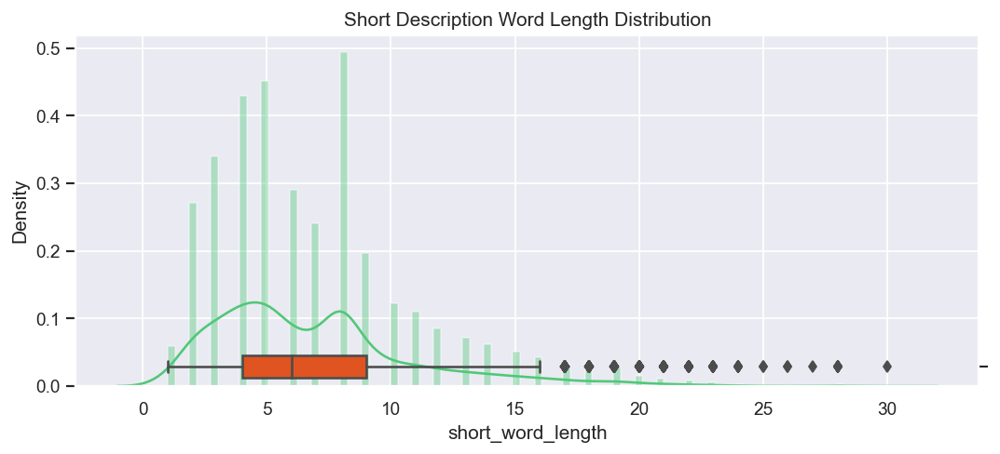

In [47]:
sns.set()
plt.figure(figsize=(10, 4), dpi=125)
ax = sns.distplot(dataset.short_word_length, bins=100, kde=True, color='#50C878')
ax_ = ax.twinx()
sns.boxplot(dataset.short_word_length, color='#FF4500')
ax_.set(ylim=(-.7, 12))
plt.title('Short Description Word Length Distribution')
plt.show()

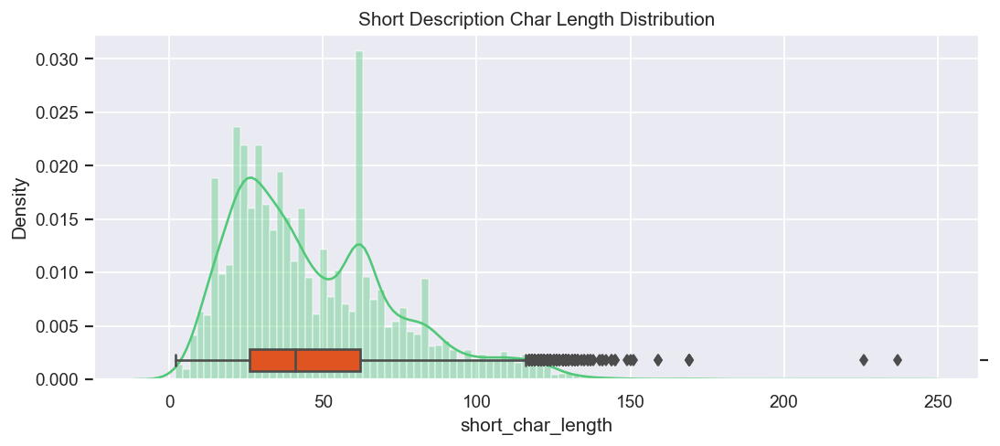

In [48]:
sns.set()
plt.figure(figsize=(10, 4), dpi=125)
ax = sns.distplot(dataset.short_char_length, bins=100, kde=True, color='#50C878')
ax_ = ax.twinx()
sns.boxplot(dataset.short_char_length, color='#FF4500')
ax_.set(ylim=(-.7, 12))
plt.title('Short Description Char Length Distribution')
plt.show()

In [49]:
dataset.describe()

,char_length,word_length,short_char_length,short_word_length
count,8499.000000,8499.000000,8499.000000,8499.000000
mean,204.595246,27.331804,47.386751,6.951759
std,519.530803,65.026307,27.323700,4.158631
min,3.000000,1.000000,2.000000,1.000000
25%,42.000000,6.000000,26.000000,4.000000
50%,106.000000,11.000000,41.000000,6.000000
75%,201.000000,28.000000,62.000000,9.000000
max,13001.000000,1625.000000,237.000000,30.000000


<h5><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Most descriptions have between 6 and 28 words long with median at 41 (106 characters) and mean at 27.2 with relatively few outliers ranging till 1625 words!<br>
    <li>Most Short descriptions have between 4 and 9 words long with median at 6 (41 characters) and mean at 6.92 with relatively few outliers ranging till 28 words.<br>
 </span></ul></h5>

In [50]:
def clean_nonsensible_outliers():
    # impute the zero length description with corresponding short description
    dataset.loc[dataset.word_length == 0, 'description'] = dataset.loc[dataset.word_length == 0]['short_description']
     # drop row with description: 's'
    dataset.drop(dataset[dataset.description == 's'].index, inplace=True)
    # description 'the' holds no information => imputed with corresponding short_description
    dataset.loc[dataset.description == 'the', 'description'] = dataset.loc[dataset.description == 'the']['short_description']

# clean_nonsensible_outliers()

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Fix Text Encoding</span></strong></li>
</ul></h3>

In [51]:
dataset[dataset.word_length == 1].sample(20)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
1955,æœ‰ä¸€ä¸ªé“¾æŽ¥æ–‡ä»¶æ‰“ä¸å¼€,æœ‰ä¸€é“¾æŽ¥æ–‡ä»¶æ‰“ä¸å¼€ï¼Œæç¤ºç‰ˆæœ¬ä½Ž,qsfcxzel quwykhno,GRP_30,45,1,30,1
5762,æ‰“å¼€office 2013æ˜¾ç¤ºæ˜¯æœªç»æŽˆæƒäº§å“,æ‰“å¼€outlookã€pptæ˜¾ç¤ºæ˜¯æœªç»æŽˆæƒäº§å“...,hbvwqine eakqyovu,GRP_48,59,1,44,2
618,outlookæ‰“ä¸å¼€,æ‰“å¼€outlookæ—¶ï¼Œæ˜¾ç¤ºoutlook.ostæ–‡ä»¶é”™è...,qayozbcd vwglmpjq,GRP_0,72,1,16,1
1399,i cant see my archived emails in outlook. i a...,outlook,koiapqbg teyldpkw,GRP_0,7,1,129,22
5146,walkmeåŠ è½½æ•…éšœ,walkmeä¸‹è½½å®‰è£…åŽï¼ŒæŒ‰é’®ä¸èƒ½åœ¨æµè§ˆå...,whflryeb fatgdzhq,GRP_48,60,1,18,2
5833,new cpp id can not request initiative. see im...,cphlme01\r\n,pfzxecbo ptygkvzl,GRP_21,10,1,58,10
5761,ä¸»æœºä¸èƒ½å¼€å¯,ä¸»æœºä¸èƒ½å¼€å¯ï¼Œç”µæºç¯æ­£å¸¸ï¼Œä¸»æœºé...,cpdilmjx jwsqpiac,GRP_48,71,1,18,1
8266,erpæ— æ³•è¿›è¡Œé‡‡è´­ï¼ˆè½¬ç»™è´ºæ­£å¹³ï¼‰,"è¿›è¡Œé‡‡è´­æ—¶æ˜¾ç¤º""æ‰¾ä¸åˆ°å‘˜å·¥111115483...",kyagjxdh dmtjpbnz,GRP_30,84,1,42,2
5311,ç³»ç»Ÿæ•…éšœï¼Œå¯åŠ¨è“å±.,ç³»ç»Ÿæ•…éšœï¼Œå¯åŠ¨è“å±.,lhkqbmna ekhtivsd,GRP_31,29,1,28,1
1178,ç”µè¯æœºæ²¡æœ‰å£°éŸ³,ç”µè¯æœºæ²¡æœ‰å£°éŸ³,cyjlqdwm kywiuosn,GRP_30,21,1,21,1


In [52]:
def fix_text_encoding(row):
    row['description'] = fix_text(row.description)
    row['short_description'] = fix_text(row.short_description)
    return row

dataset = dataset.progress_apply(fix_text_encoding, axis=1)
dataset[dataset.word_length == 1].sample(20)  # translated to proper unicode text in chineese

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8499/8499 [00:04<00:00, 1898.98it/s]


,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
1178,电话机没有声音,电话机没有声音,cyjlqdwm kywiuosn,GRP_30,21,1,21,1
5147,电脑开机故障,"原材料仓库电脑开机蓝屏,主机面板3、4指示灯报警",ycjxrsba ehftdorm,GRP_48,68,1,18,1
608,etiketten drucker im bereich endkontrolle germ...,funktionsstörung,tzmewbdv zjbuwmkn,GRP_33,17,1,56,7
7302,skype会议时不去,skype会议从邮箱里的链接进不去。,rekpvblc ufysatml,GRP_30,44,1,20,1
7317,电脑故障,"质控部拉力试验机控制电脑的操作系统启动非常缓慢,控制软件丢失。",kwpzbxvf cvuhoizx,GRP_48,93,1,12,1
3738,电话故障,"铸棒车间电话故障,39523850",sbkhjigv pbvlfcse,GRP_48,35,1,12,1
415,reset passwords for prgewfly ndtfvple using pa...,complete,prgewfly ndtfvple,GRP_17,8,1,84,9
1081,用友软件问题,"打开已关闭的销售订单时,显示""不能在手动或分布事物方式下创建新的链接""",bwstnmjh yqumwrsk,GRP_48,101,1,18,1
7588,显示器不亮,早上开机后显示器不出图像。,wgmqlnzh vpebwoat,GRP_30,39,1,15,1
618,outlook打不开,"打开outlook时,显示outlook.ost文件错误,程序自动关闭。",qayozbcd vwglmpjq,GRP_0,72,1,16,1


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Keyword Extraction</span></strong></li>
</ul></h3>

In [53]:
# !pip -q installyake
import yake

language = "en"
max_ngram_size = 5
duplication_threshold = 0.9
numOfKeywords = 1

custom_kw_extractor = yake.KeywordExtractor(lan=language,
                                            n=max_ngram_size,
                                            dedupLim=duplication_threshold,
                                            top=numOfKeywords,
                                            features=None)

In [54]:
def get_keywords(row):
    '''Keyword extraction on Keywords and Short Keywords'''
    description_keywords = custom_kw_extractor.extract_keywords(row.description)
    if len(description_keywords) == 0:
        description_keywords = ''
    elif len(description_keywords) == 1:
        description_keywords = description_keywords[0][0]
    else:
        description_keywords = ' '.join([i[0] for i in description_keywords])
        # print(row)
    row['description_keywords'] = description_keywords
    description_keywords = custom_kw_extractor.extract_keywords(row.short_description)
    if len(description_keywords) == 0:
        description_keywords = ''
    elif len(description_keywords) == 1:
        description_keywords = description_keywords[0][0]
    else:
        description_keywords = ' '.join([i[0] for i in description_keywords])
        # print(row)
    row['short_description_keywords'] = description_keywords
    return row

dataset = dataset.progress_apply(get_keywords, axis=1)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8499/8499 [01:11<00:00, 119.70it/s]


In [55]:
# TODO: clean caller ids, ..  from descriptions before keyword extraction?
dataset.sample(20)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords
6387,HostName_1010(erp search_server server): erpst...,HostName_1010(erp search_server server): erpst...,rkupnshb gsmzfojw,GRP_14,73,7,73,7,erp search,erp search
2837,probleme mit hp drucker local .\petljhxi bocxgins,probleme mit hp drucker local .\petljhxi bocxgins,petljhxi bocxgins,GRP_24,49,7,49,7,probleme mit hp drucker local,probleme mit hp drucker local
812,unable to connect to home printer,unable to connect to home printer,wstxjbpv tjlncygd,GRP_0,33,6,33,6,unable to connect to home,unable to connect to home
950,collaboration_platform issue,\nsummary:having issues with collaboration_pla...,lpoebzsc grknswyo,GRP_0,190,29,29,2,issues with collaboration,platform issue
2450,unable to print from wy33 printer,unable to print from wy33 printer\n___________...,cowsvzel ryhkefwv,GRP_19,558,80,33,6,printer,printer
4801,"network outage: apac , site hard down since 7:...",what type of outage: __x___network _____c...,spxqmiry zpwgoqju,GRP_8,1160,130,78,15,type of outage,site hard down since 7:29
1415,issue with microsoft office - key entry.,\n\nreceived from: hcyemunl.lnecsgpd@gmail.com...,hcyemunl lnecsgpd,GRP_0,300,45,40,7,enclosed the screen shot,issue with microsoft office
3880,wireless access companyguest request,\n\nreceived from: sbgvrncj.idfhtoqv@gmail.com...,sbgvrncj idfhtoqv,GRP_0,275,26,36,4,tool wireless access for germany,wireless access companyguest request
7887,password reset as its expired,name:ivxybewh ykhsqvnu\nlanguage:\nbrowser:mic...,ivxybewh ykhsqvnu,GRP_0,215,27,29,5,microsoft internet explorer email,password reset as its expired
7374,re: deployment notification | telephony_softwa...,\n\nreceived from: vetkdblx.nsuwkraj@gmail.com...,vetkdblx nsuwkraj,GRP_0,1047,149,53,6,software,deployment notification


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Word Frequency Distributions & WordClouds</span></strong></li>
</ul></h3>

In [56]:
# top 50 most frequent words in text
top_N = 50

words = (dataset.description.str.cat(sep=' ').split())
rslt = pd.DataFrame(Counter(words).most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')

In [57]:
rslt[:50].transpose()

Word,to,the,in,is,from:,and,received,i,on,for,...,can,we,as,access,when,site,am,account,ticket,error
Frequency,6296,6254,3172,2670,2499,2384,2354,2244,1977,1946,...,684,669,665,664,656,654,645,627,605,577


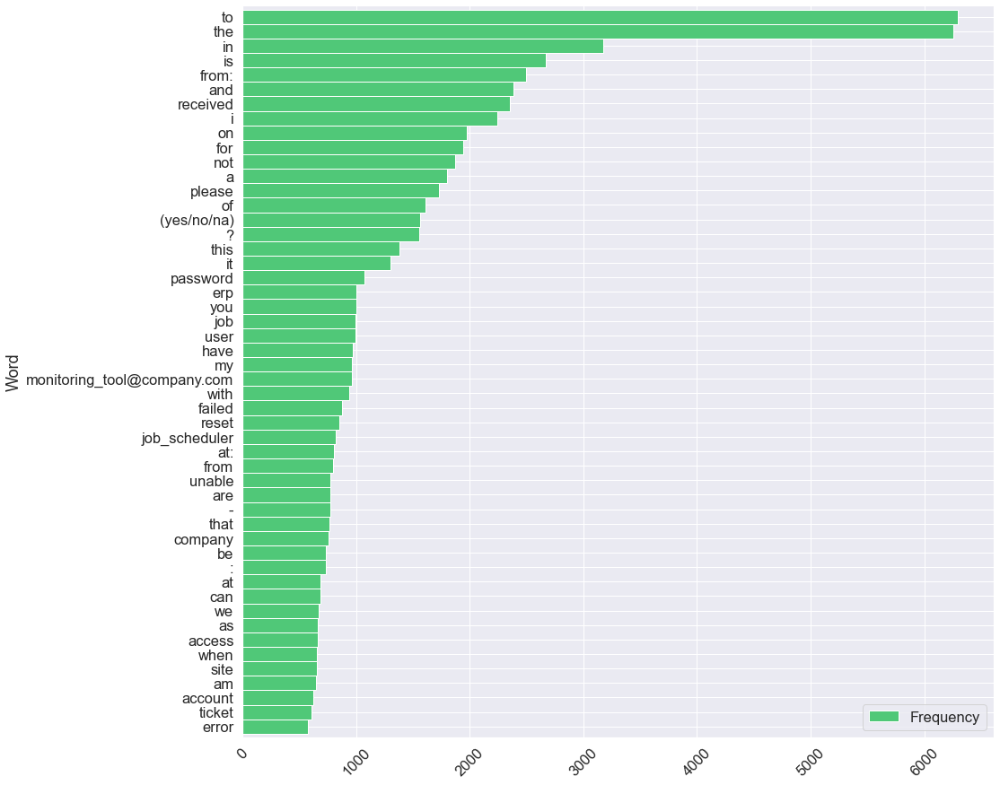

In [58]:
sns.set(font_scale=1.5)  # scale up font size
rslt.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=1, figsize=(15, 15), color='#50C878')
plt.xticks(rotation=45)
plt.show()

In [59]:
pprint(rslt.index.tolist(), compact=True)

['to', 'the', 'in', 'is', 'from:', 'and', 'received', 'i', 'on', 'for', 'not',
 'a', 'please', 'of', '(yes/no/na)', '?', 'this', 'it', 'password', 'erp',
 'you', 'job', 'user', 'have', 'my', 'monitoring_tool@company.com', 'with',
 'failed', 'reset', 'job_scheduler', 'at:', 'from', 'unable', 'are', '-',
 'that', 'company', 'be', ':', 'at', 'can', 'we', 'as', 'access', 'when',
 'site', 'am', 'account', 'ticket', 'error']


<h5><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Stopwords and Anchor words like 'From:', 'Recieved' have to be stripped out
 </span></ul></h5>

In [60]:
# top 50 most frequent words in text
top_N = 50

words = (dataset.short_description.str.cat(sep=' ').split())
rslt = pd.DataFrame(Counter(words).most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')

In [61]:
rslt[:50].transpose()

Word,to,in,not,job,on,is,password,erp,failed,job_scheduler,...,with,i,my,crm,ticket,windows,/,am,password_management_tool,network
Frequency,2167,1737,981,976,917,856,847,822,822,811,...,193,191,187,185,182,177,177,168,161,155


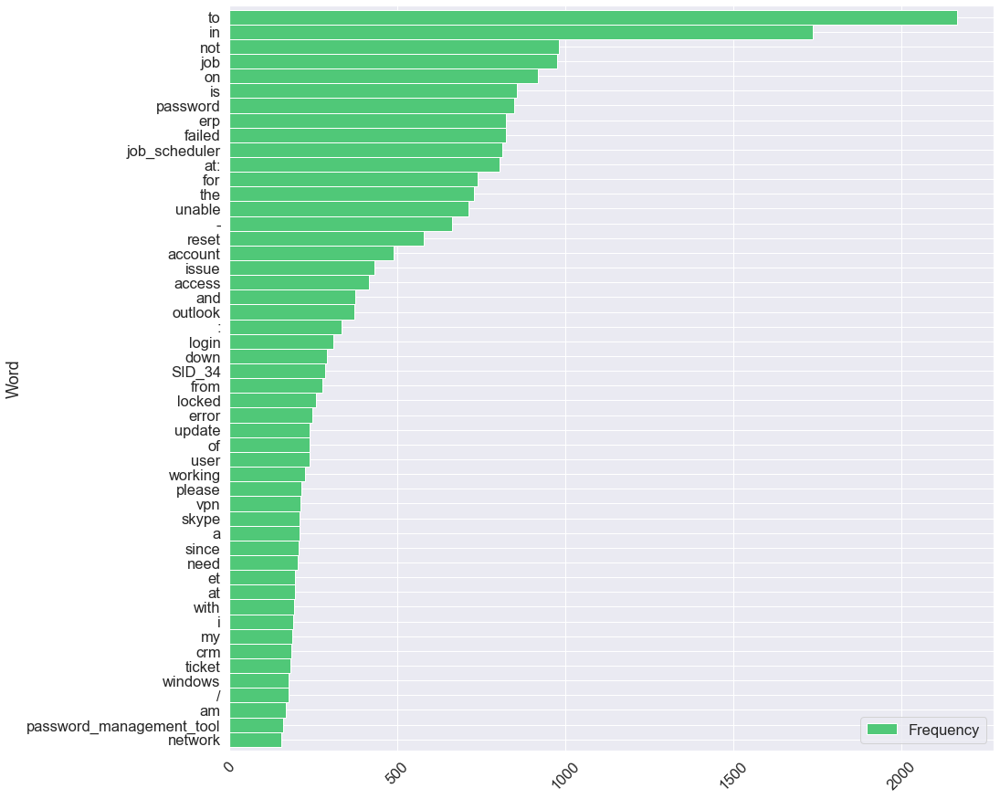

In [62]:
sns.set(font_scale=1.5)  # scale up font size
rslt.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=1, figsize=(15, 15), color='#50C878')
plt.xticks(rotation=45)
plt.show()

In [63]:
pprint(rslt.index.tolist(), compact=True)

['to', 'in', 'not', 'job', 'on', 'is', 'password', 'erp', 'failed',
 'job_scheduler', 'at:', 'for', 'the', 'unable', '-', 'reset', 'account',
 'issue', 'access', 'and', 'outlook', ':', 'login', 'down', 'SID_34', 'from',
 'locked', 'error', 'update', 'of', 'user', 'working', 'please', 'vpn', 'skype',
 'a', 'since', 'need', 'et', 'at', 'with', 'i', 'my', 'crm', 'ticket',
 'windows', '/', 'am', 'password_management_tool', 'network']


<h5><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Many stopwords are occuring most frequently in the dataset. We might need to use stopword removal in our pre-processing if it improves the model performance.
 </span></ul></h5>

In [64]:
descr_string = ""
for description in dataset['description']:
    descr_string += description
    descr_string += " "

short_descr_string = ""
for description in dataset['short_description']:
    short_descr_string += description
    short_descr_string += " "

grp0_string = ""
for description in temp.loc[temp.group == 'Group 0', 'description']:
    grp0_string += description
    grp0_string += " "

other_string = ""
for description in temp.loc[temp.group == 'Other', 'description']:
    other_string += description
    other_string += " "

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Descriptions WordCloud</span></strong></li>
</ul></h4>

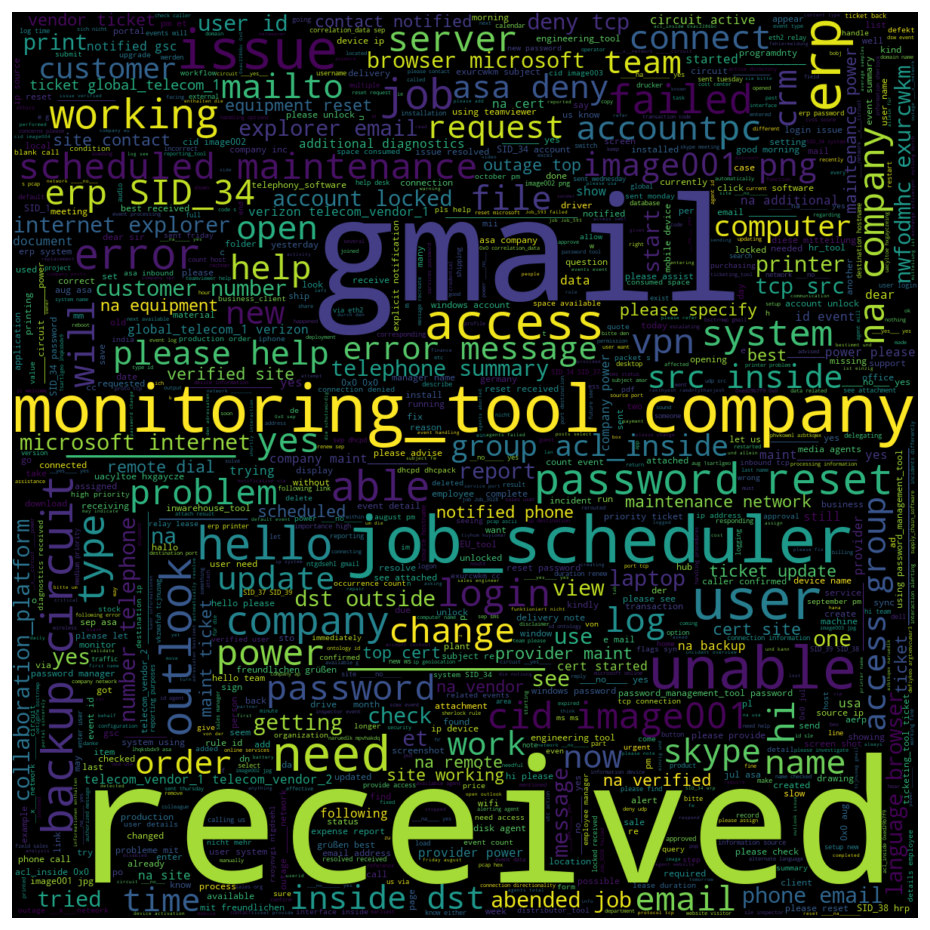

In [65]:
plt.figure(figsize=(10,10), dpi=120)
WC = WordCloud(width=1200, height=1200, max_words=1000, min_font_size=5)
plt.imshow(WC.generate(descr_string), interpolation='bilinear')
plt.axis("off")
plt.show()

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Short Descriptions WordCloud</span></strong></li>
</ul></h4>

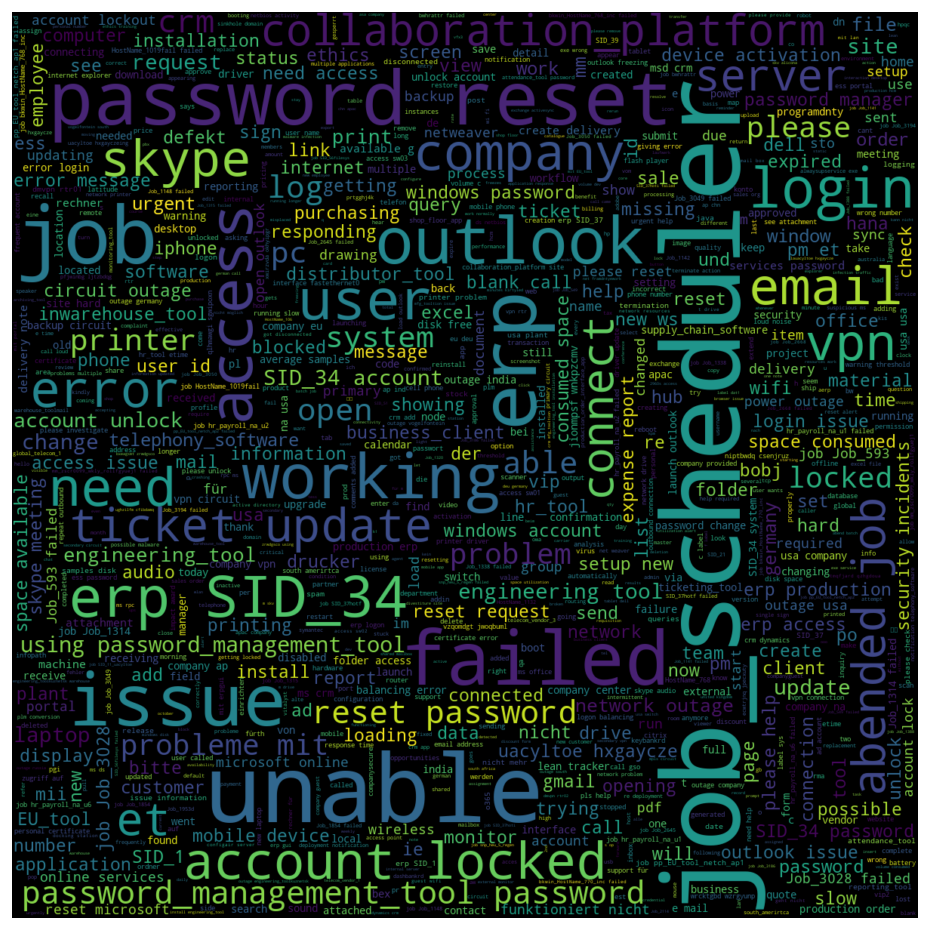

In [66]:
# Non-Sarcastic descriptions wordcloud
plt.figure(figsize=(10,10), dpi=120)
WC = WordCloud(width=1200, height=1200, max_words=1000, min_font_size=5)
plt.imshow(WC.generate(short_descr_string), interpolation='bilinear')
plt.axis("off")
plt.show()

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Group 0 Descriptions WordCloud</span></strong></li>
</ul></h4>

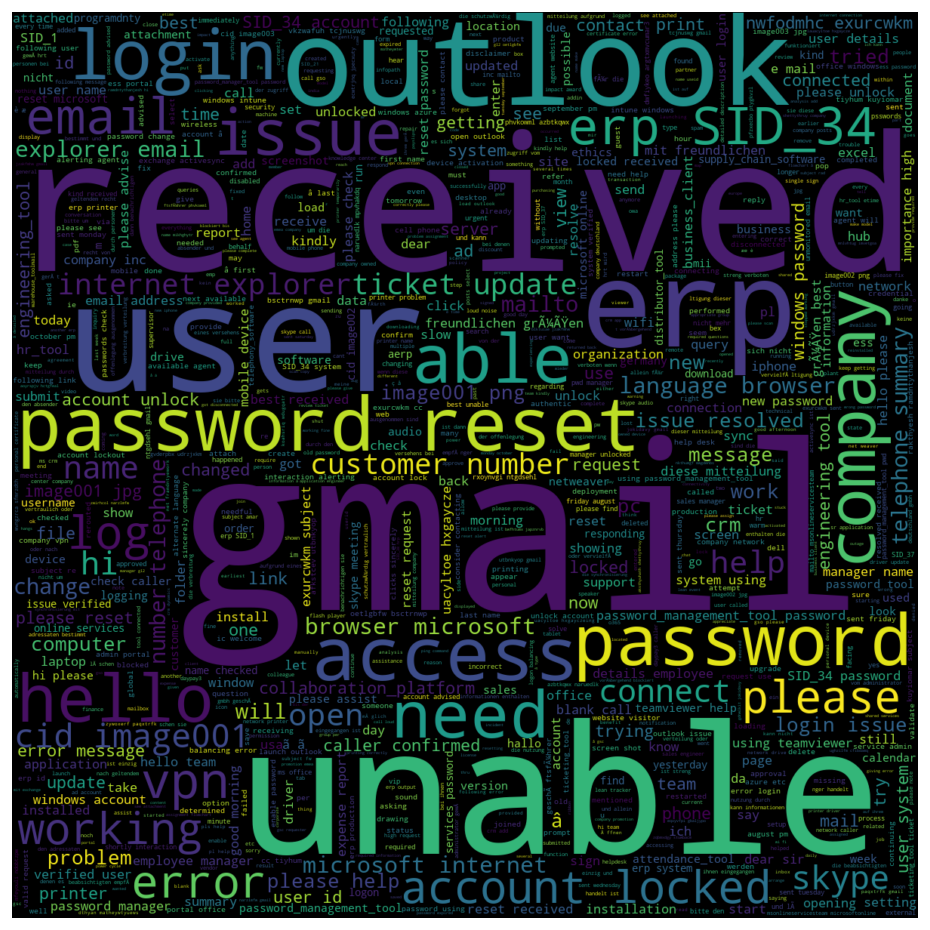

In [67]:
# Non-Sarcastic descriptions wordcloud
plt.figure(figsize=(10,10), dpi=120)
WC = WordCloud(width=1200, height=1200, max_words=1000, min_font_size=5)
plt.imshow(WC.generate(grp0_string), interpolation='bilinear')
plt.axis("off")
plt.show()

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Other Groups Descriptions WordCloud</span></strong></li>
</ul></h4>

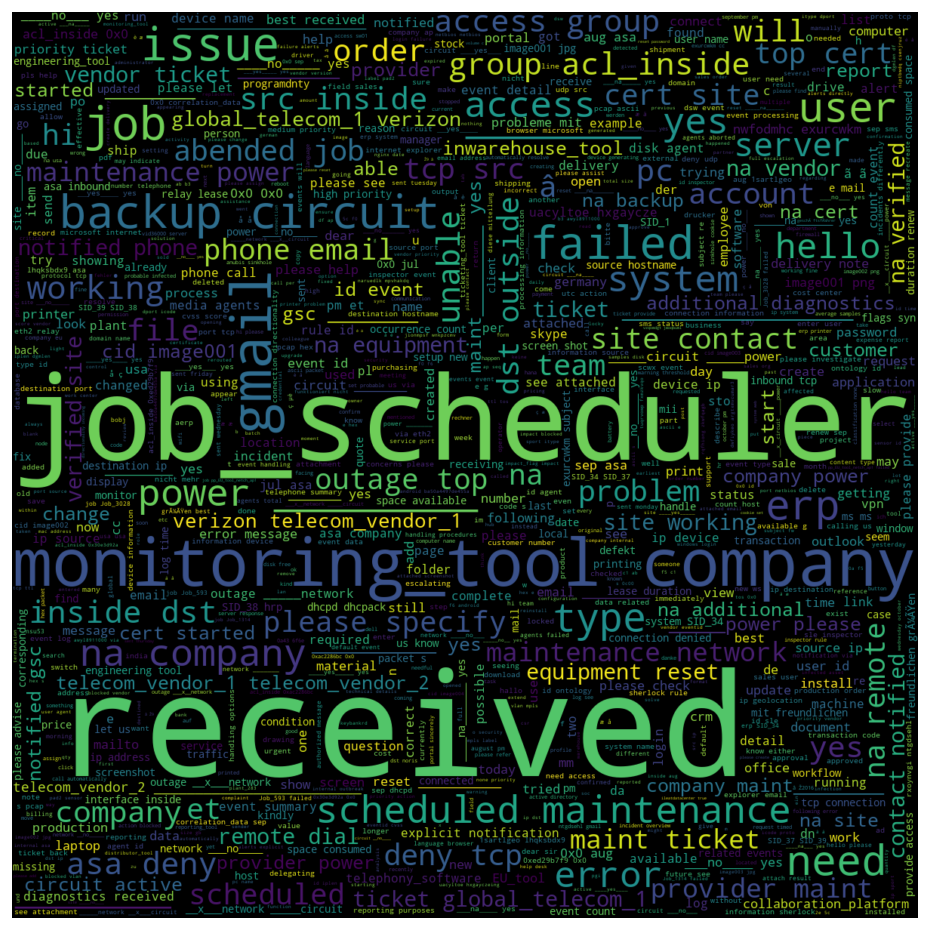

In [68]:
# Non-Sarcastic descriptions wordcloud
plt.figure(figsize=(10,10), dpi=120)
WC = WordCloud(width=1200, height=1200, max_words=1000, min_font_size=5)
plt.imshow(WC.generate(other_string), interpolation='bilinear')
plt.axis("off")
plt.show()

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Short Descriptions
 </span></ul></h4>

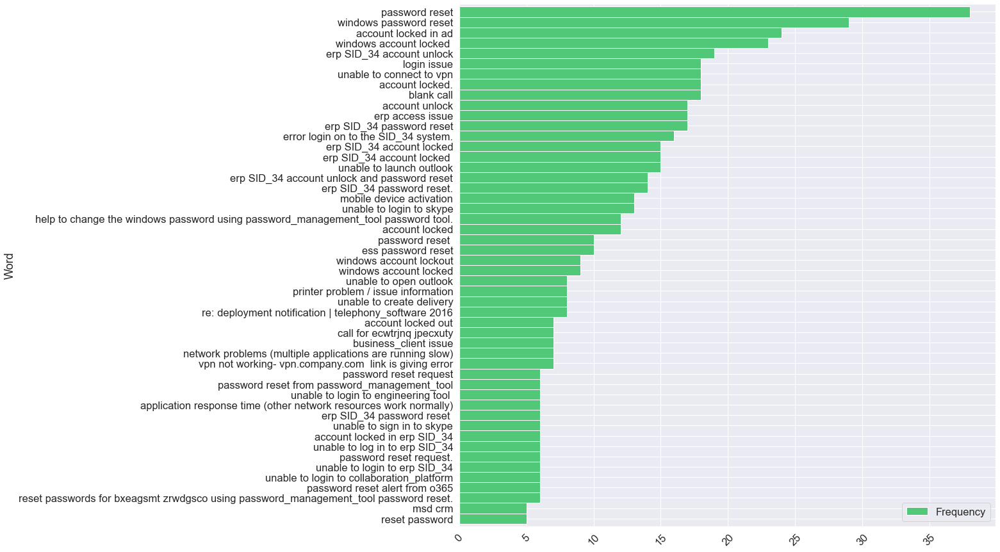

In [69]:
top_N = 50
rslt = pd.DataFrame(Counter(dataset.short_description.tolist()).most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')
sns.set(font_scale=1.5)  # scale up font size
rslt.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=1, figsize=(15, 15), color='#50C878')
plt.xticks(rotation=45)
plt.show()

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Descriptions
 </span></ul></h4>

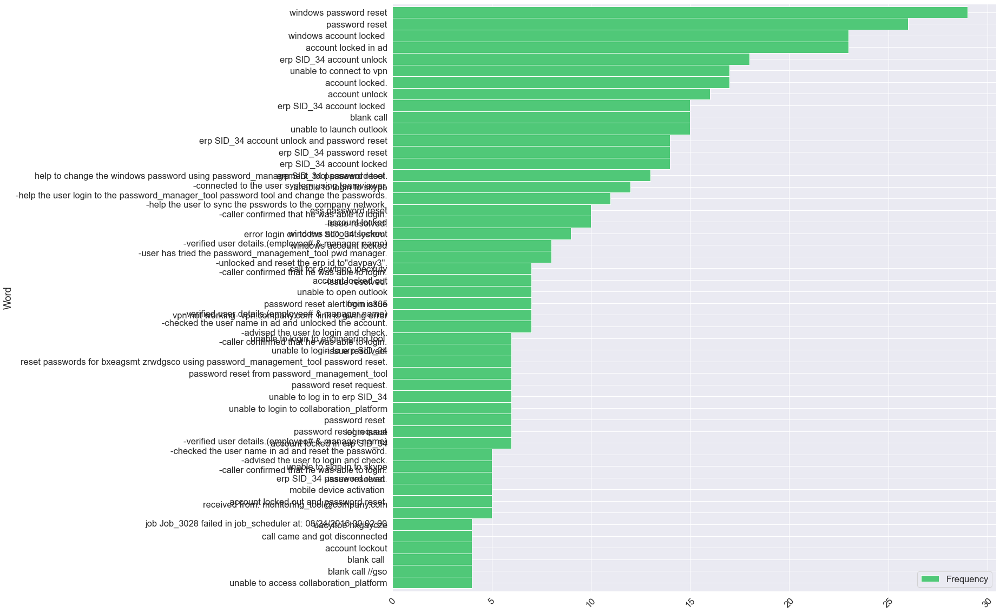

In [70]:
top_N = 50
rslt = pd.DataFrame(Counter(dataset.description.tolist()).most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')
sns.set(font_scale=1.5)  # scale up font size
rslt.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=1, figsize=(20, 20), color='#50C878')
plt.xticks(rotation=45)
plt.show()

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Description Lengths vs. Functional Group</span></strong></li>
</ul></h3>

In [71]:
le = LabelEncoder()
dataset['group_code'] = le.fit_transform(dataset.group)
dataset.sample(7)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code
5914,erp account password reset,"ic\n welcome, our next available agent will be...",sndaofyw jetcxpda,GRP_0,230,29,26,4,shortly,erp account password reset,0
3322,job Job_3186 failed in job_scheduler at: 09/25...,received from: monitoring_tool@company.com\n\n...,bpctwhsn kzqsbmtp,GRP_10,106,11,62,8,job Job,job Job,2
2404,info type '0017' is missing to personal number...,"from: qkmvosen opundxsk \nsent: tuesday, octob...",qkmvosen opundxsk,GRP_10,206,28,55,9,n´t work for personal number,missing to personal number,2
4952,password reset,password reset,alfqhigv zofjibkr,GRP_0,14,2,14,2,password reset,password reset,0
1688,HostName_97: disk space on e:\ label:dat1-Host...,HostName_97: disk space on e:\ label:dat1-Host...,dkmcfreg anwmfvlg,GRP_12,107,16,107,16,disk space,disk space,4
6833,please add office printer in my new laptop,\n\nreceived from: qrnusygw.amiebrlf@gmail.com...,qrnusygw amiebrlf,GRP_19,152,20,42,8,add the office printer,add office printer,11
2814,engineering_tool error: machining cloud stoppe...,engineering_tool error: machining cloud stoppe...,keinyujo torvxeda,GRP_0,55,6,55,6,machining cloud stopped working,machining cloud stopped working,0


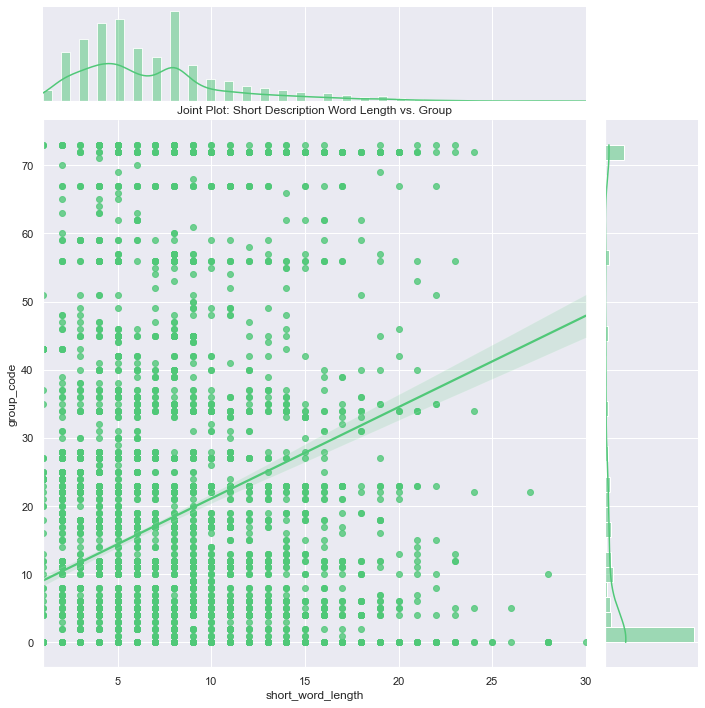

In [72]:
sns.set()
sns.jointplot(dataset.short_word_length, dataset.group_code, 
              kind='reg', color='#50C878', height=10)
plt.title('Joint Plot: Short Description Word Length vs. Group')
plt.show()

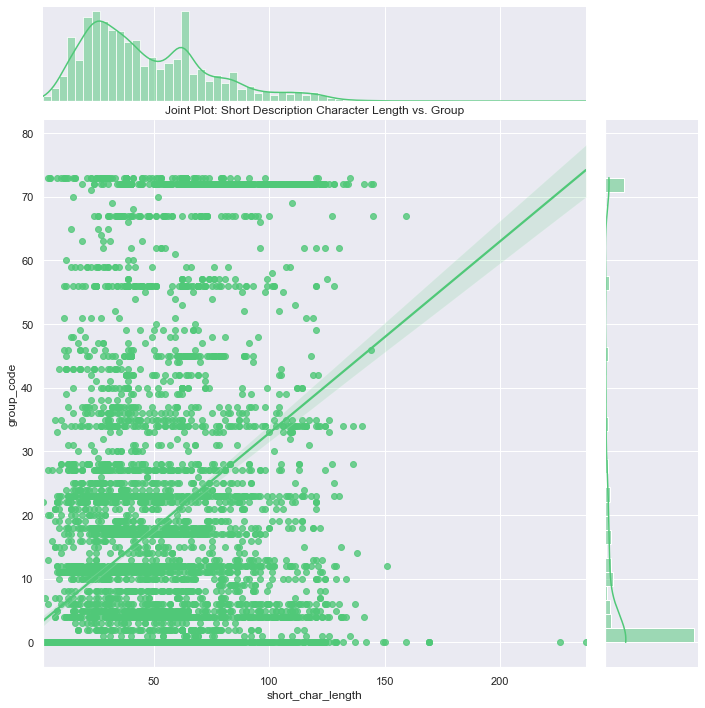

In [73]:
sns.set()
sns.jointplot(dataset.short_char_length, dataset.group_code, 
              kind='reg', color='#50C878', height=10)
plt.title('Joint Plot: Short Description Character Length vs. Group')
plt.show()

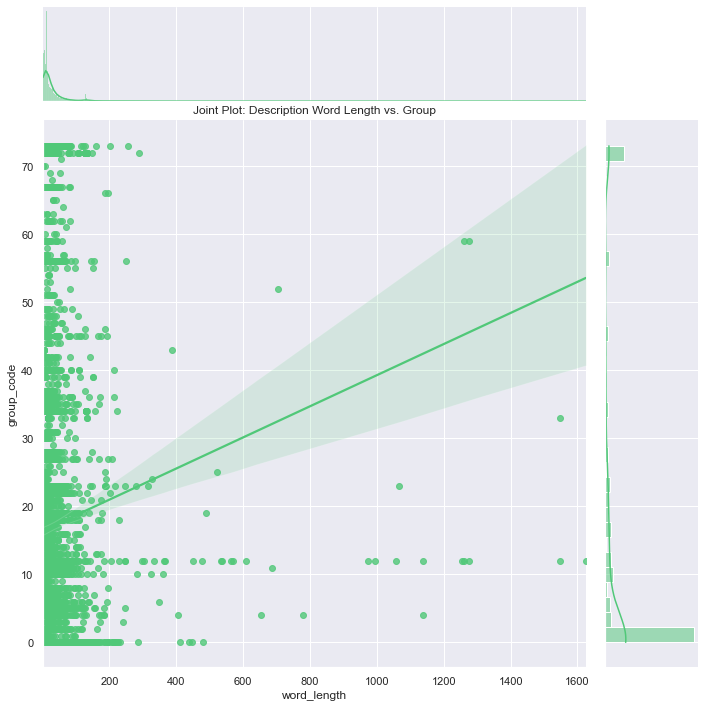

In [74]:
sns.set()
sns.jointplot(dataset.word_length, dataset.group_code, 
              kind='reg', color='#50C878', height=10)
plt.title('Joint Plot: Description Word Length vs. Group')
plt.show()

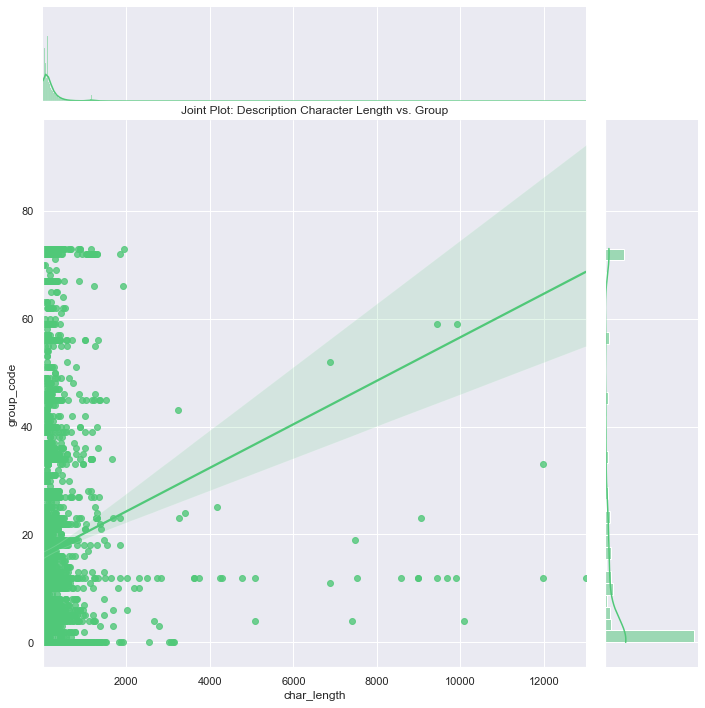

In [75]:
sns.set()
sns.jointplot(dataset.char_length, dataset.group_code, 
              kind='reg', color='#50C878', height=10)
plt.title('Joint Plot: Description Character Length vs. Group')
plt.show()

In [76]:
# binning the lengths

import jenkspy

NUM_BINS = 100
# calculates the natural breaks in a series, exploiting the Fisher-Jenks algorithm
# https://en.wikipedia.org/wiki/Jenks_natural_breaks_optimization
breaks = jenkspy.jenks_breaks(dataset['char_length'], nb_class=NUM_BINS)
labels = list(range(len(breaks) - 1))
pprint(breaks, compact=True)

[3.0, 17.0, 23.0, 28.0, 34.0, 40.0, 47.0, 55.0, 63.0, 71.0, 80.0, 90.0, 101.0,
 109.0, 117.0, 126.0, 137.0, 149.0, 160.0, 170.0, 180.0, 190.0, 201.0, 213.0,
 224.0, 235.0, 247.0, 259.0, 271.0, 283.0, 295.0, 308.0, 323.0, 338.0, 354.0,
 372.0, 392.0, 412.0, 431.0, 449.0, 468.0, 486.0, 508.0, 537.0, 568.0, 596.0,
 620.0, 653.0, 684.0, 720.0, 765.0, 801.0, 837.0, 866.0, 908.0, 934.0, 990.0,
 1026.0, 1063.0, 1116.0, 1157.0, 1176.0, 1197.0, 1234.0, 1265.0, 1301.0, 1347.0,
 1398.0, 1478.0, 1526.0, 1692.0, 1877.0, 1952.0, 2013.0, 2172.0, 2293.0, 2548.0,
 2744.0, 2833.0, 3062.0, 3141.0, 3249.0, 3403.0, 3628.0, 3734.0, 4169.0, 4286.0,
 4766.0, 5087.0, 6887.0, 7403.0, 7524.0, 8575.0, 8991.0, 9063.0, 9440.0, 9678.0,
 9912.0, 10077.0, 11968.0, 13001.0]


In [77]:
dataset['char_length_bins'] = pd.cut(dataset['char_length'] ,bins=breaks, labels=labels, include_lowest=True)

In [78]:
dataset

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,206,33,11,2,verified user details.,login issue,0,22
1,outlook,\n\nreceived from: hmjdrvpb.komuaywn@gmail.com...,hmjdrvpb komuaywn,GRP_0,194,25,7,1,appearing in my outlook calendar,outlook,0,21
2,cant log in to vpn,\n\nreceived from: eylqgodm.ybqkwiam@gmail.com...,eylqgodm ybqkwiam,GRP_0,87,11,18,5,log on to vpn,log in to vpn,0,10
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,29,5,29,5,tool page,tool page,0,3
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,12,2,12,2,skype error,skype error,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
8495,emails not coming in from zz mail,\n\nreceived from: avglmrts.vhqmtiua@gmail.com...,avglmrts vhqmtiua,GRP_29,141,19,33,7,good afternoon,emails not coming,22,16
8496,telephony_software issue,telephony_software issue,rbozivdq gmlhrtvp,GRP_0,24,2,24,2,software issue,software issue,0,2
8497,vip2: windows password reset for tifpdchb pedx...,vip2: windows password reset for tifpdchb pedx...,oybwdsgx oxyhwrfz,GRP_0,50,7,50,7,windows password reset for tifpdchb,windows password reset for tifpdchb,0,6
8498,machine não está funcionando,i am unable to access the machine utilities to...,ufawcgob aowhxjky,GRP_62,103,17,30,4,finish the drawers adjustment settings.,machine não está funcionando,59,12


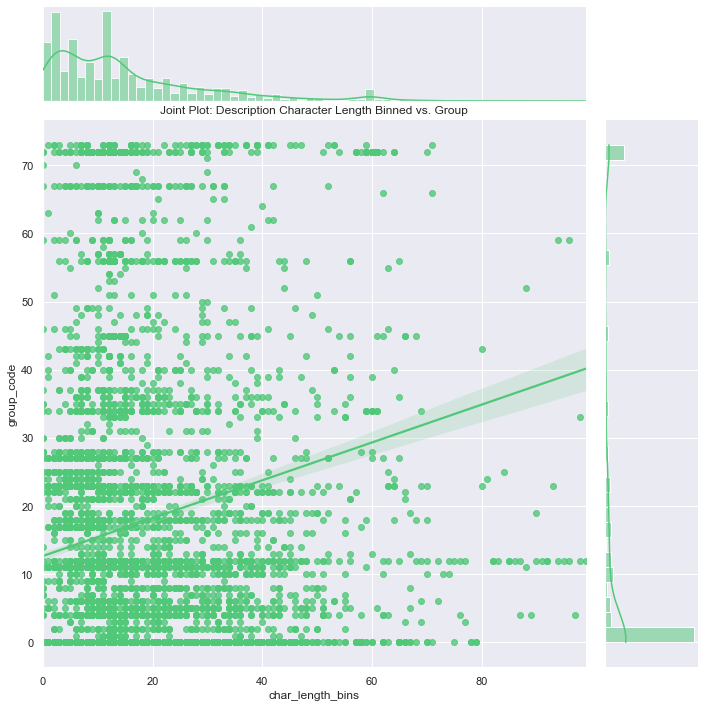

In [79]:
sns.set()
sns.jointplot(dataset.char_length_bins.astype(int), dataset.group_code, 
              kind='reg', color='#50C878', height=10)
plt.title('Joint Plot: Description Character Length Binned vs. Group')
plt.show()

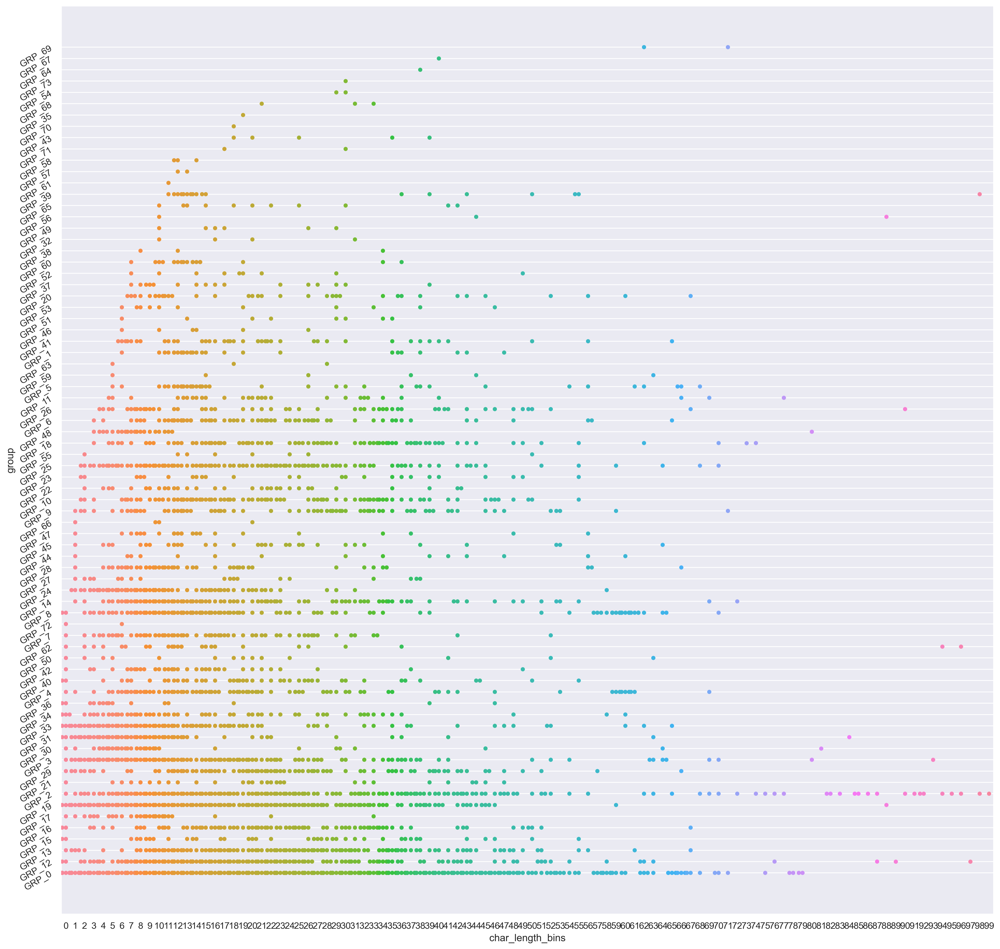

In [80]:
sns.set()
plt.figure(figsize=(20,20), dpi=300)
sns.swarmplot(x="char_length_bins", y="group", data=dataset)
plt.yticks(rotation=30)
plt.show()

In [81]:
# TODO: perform Chi2 Test with group to decide whether to include length features
import scipy.stats as stats
data_crosstab = pd.crosstab(dataset['caller'],
                            dataset['group'],
                            margins=True,
                            margins_name="Total")
data_crosstab

group,GRP_0,GRP_1,GRP_10,GRP_11,GRP_12,GRP_13,GRP_14,GRP_15,GRP_16,GRP_17,...,GRP_68,GRP_69,GRP_7,GRP_70,GRP_71,GRP_72,GRP_73,GRP_8,GRP_9,Total
caller,,,,,,,,,,,,,,,,,,,,,
DEsowkrH sciejzNE,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2
HdOuWxAt qfKdlJMx,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
ZkBogxib QsEJzdZO,0,1,2,0,0,0,2,0,0,0,...,0,0,0,0,0,0,0,54,31,151
abiuclvj brziktno,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
abtknpew ifcekjdb,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zylwdbig wdkbztjp,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
zymdwqsi jzvbthil,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
zywoxerf paqxtrfk,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,9


In [82]:
# significance level
alpha = 0.05

# Calcualtion of Chisquare test statistics
chi_square = 0
rows = dataset['caller'].unique()
columns = dataset ['group'].unique()
for i in columns:
    for j in rows:
        O = data_crosstab[i][j]
        E = data_crosstab[i]['Total'] * data_crosstab['Total'][j] / data_crosstab['Total']['Total']
        chi_square += (O-E)**2/E

# The p-value approach
print("Approach 1: The p-value approach to hypothesis testing in the decision rule")
p_value = 1 - stats.norm.cdf(chi_square, (len(rows)-1)*(len(columns)-1))
conclusion = "Failed to reject the null hypothesis."
if p_value <= alpha:
    conclusion = "Null Hypothesis is rejected."
        
print("chisquare-score is:", chi_square, " and p value is:", p_value)
print(conclusion)

Approach 1: The p-value approach to hypothesis testing in the decision rule
chisquare-score is: 268747.2241233948  and p value is: 0.0
Null Hypothesis is rejected.


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Language Detection</span></strong></li>
</ul></h3>

https://fasttext.cc/docs/en/language-identification.html

In [83]:
# TODO: try out fastText pre-trained language identification model (less latency) &
# Google CLD3 (Google Compact Language Detector v3)

# ! pip -q install fasttext
# import fasttext

# path_to_pretrained_model = './artifact/models/lid.176.bin'  # lid (Language identification modeel which can recognize 176 languages)
# fmodel = fasttext.load_model(path_to_pretrained_model)
# text = "+86 Hi there"
# fmodel.predict([text])

In [84]:
from langdetect import DetectorFactory, detect_langs
from langdetect.lang_detect_exception import LangDetectException

DetectorFactory.seed = seed

# detect the languages in the dataset
languages = []
errs = []
lang_samples = defaultdict(list)
for text in tqdm(dataset.description):
    try:
        lang = detect_langs(text)
        clean_lang = str(lang).split(':')[0][1:]
        lang_samples[clean_lang].append(text)
        languages.append(clean_lang)
    except LangDetectException as e:
        errs.append(text)
        print('text: ', text)
        print(e)

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 6262/8499 [01:27<00:28, 77.19it/s]

text:  +86  
No features in text.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8499/8499 [01:59<00:00, 70.97it/s]


In [85]:
print("Unique languages in the descriptions: "
      f"{np.unique(languages)}")

Unique languages in the descriptions: ['af' 'ca' 'cs' 'cy' 'da' 'de' 'en' 'es' 'et' 'fi' 'fr' 'hr' 'hu' 'id'
 'it' 'ja' 'ko' 'lt' 'lv' 'nl' 'no' 'pl' 'pt' 'ro' 'sk' 'sl' 'so' 'sq'
 'sv' 'sw' 'tl' 'tr' 'vi' 'zh-cn']


In [86]:
lang_freqs = {i: len(lang_samples[i]) for i in lang_samples}
freq_df = pd.DataFrame({'Language': lang_freqs.keys(), 'Frequency': lang_freqs.values()},
                      columns=['Language', 'Frequency']).set_index('Language')
freq_df.T

Language,en,no,es,it,af,sv,ca,nl,de,fr,...,lt,ja,sk,tr,sw,vi,so,lv,cs,hu
Frequency,7058,67,65,144,262,37,40,48,424,111,...,4,1,1,1,1,3,1,2,1,1


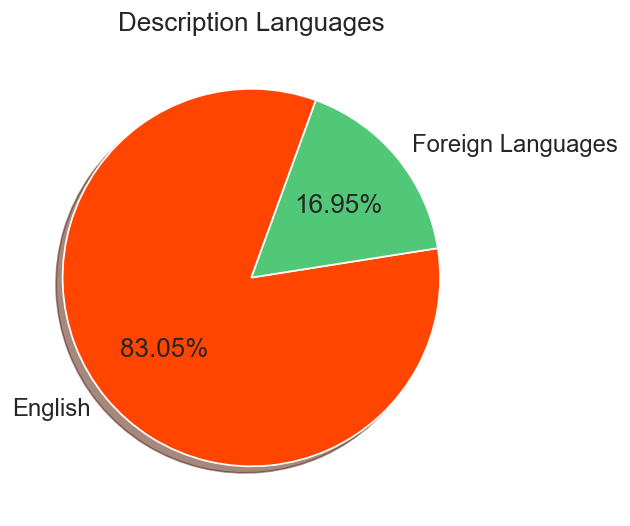

In [87]:
sns.set(font_scale=1.25)  # scale up font size

plt.figure(figsize=(5, 5), dpi=125)
eng = freq_df.loc['en'].tolist()[0]
foreign_lang = len(dataset) - freq_df.loc['en'].tolist()[0]

plt.pie(x=[eng, foreign_lang],
        explode=(0, 0),
        labels=['English', 'Foreign Languages'],
        autopct='%1.2f%%',
        shadow=True,
        startangle=70,
        colors=['#FF4500', '#50C878'])

fig = plt.gcf()
fig.set_size_inches(5, 5)
plt.title('Description Languages')
plt.show()

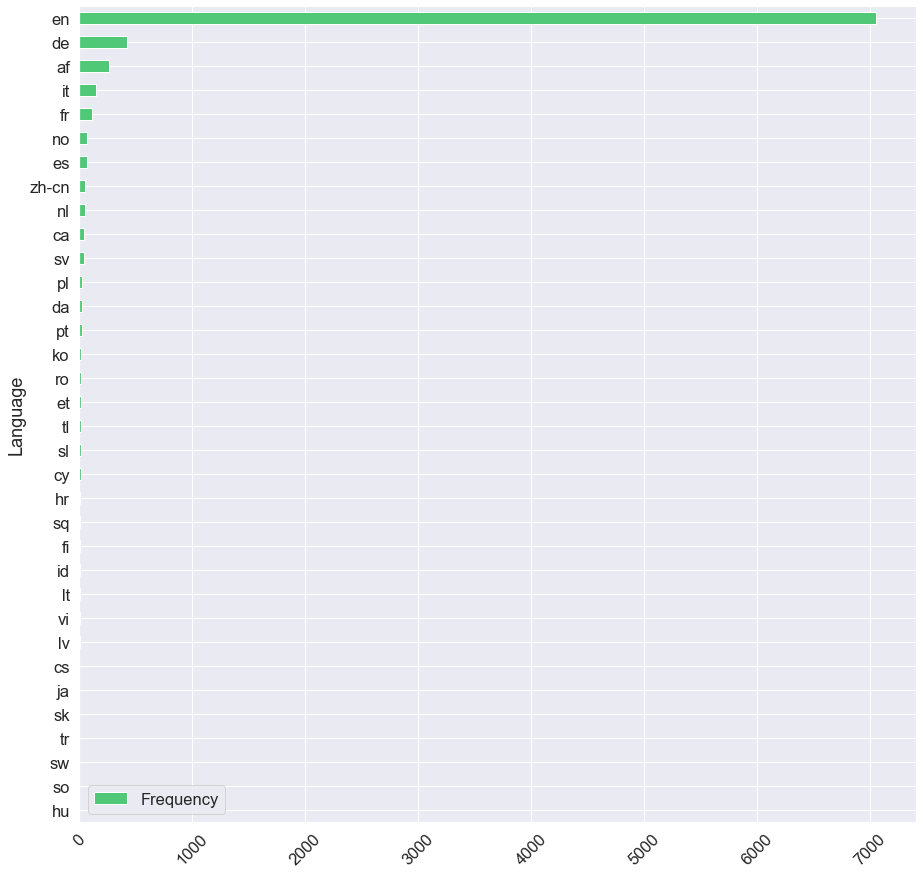

In [88]:
sns.set(font_scale=1.5)  # scale up font size
freq_df.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=0.5, figsize=(15, 15), color='#50C878')
plt.xticks(rotation=45)
plt.show()

In [89]:
# for i in lang_samples:
#     print(i)
#     try:
#         print(random.sample(lang_samples[i], 3))
#     except Exception:
#         print(random.sample(lang_samples[i], 1))
#     print('')

In [90]:
# detect the languages in the dataset
languages = []
lang_samples = defaultdict(list)
for text in tqdm(dataset.short_description):
    try:
        lang = detect_langs(text)
        clean_lang = str(lang).split(':')[0][1:]
        lang_samples[clean_lang].append(text)
        languages.append(clean_lang)
    except LangDetectException as e:
        errs.append(text)
        print('text: ', text)
        print(e)

 22%|██████████████████████████████████████████▎                                                                                                                                                        | 1844/8499 [00:30<02:17, 48.31it/s]

text:  bgflmyar.xgufkidq@gmail.com
No features in text.


 35%|████████████████████████████████████████████████████████████████████▎                                                                                                                              | 2979/8499 [00:51<01:50, 49.92it/s]

text:  ???????????????????
No features in text.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8499/8499 [02:30<00:00, 56.38it/s]


In [91]:
print("Unique languages in the short descriptions: "
      f"{np.unique(languages)}")

Unique languages in the short descriptions: ['af' 'ca' 'cs' 'cy' 'da' 'de' 'en' 'es' 'et' 'fi' 'fr' 'hr' 'hu' 'id'
 'it' 'ko' 'lt' 'lv' 'nl' 'no' 'pl' 'pt' 'ro' 'sk' 'sl' 'so' 'sq' 'sv'
 'sw' 'tl' 'tr' 'vi' 'zh-cn']


In [92]:
lang_freqs = {i: len(lang_samples[i]) for i in lang_samples}
freq_df = pd.DataFrame({'Language': lang_freqs.keys(), 'Frequency': lang_freqs.values()},
                       columns=['Language', 'Frequency']).set_index('Language')
freq_df.T

Language,en,et,no,es,it,nl,af,sv,ro,fr,...,vi,hr,pt,ko,lt,so,sw,lv,tr,hu
Frequency,6121,25,157,95,287,140,489,60,45,245,...,9,6,33,15,9,5,1,4,1,1


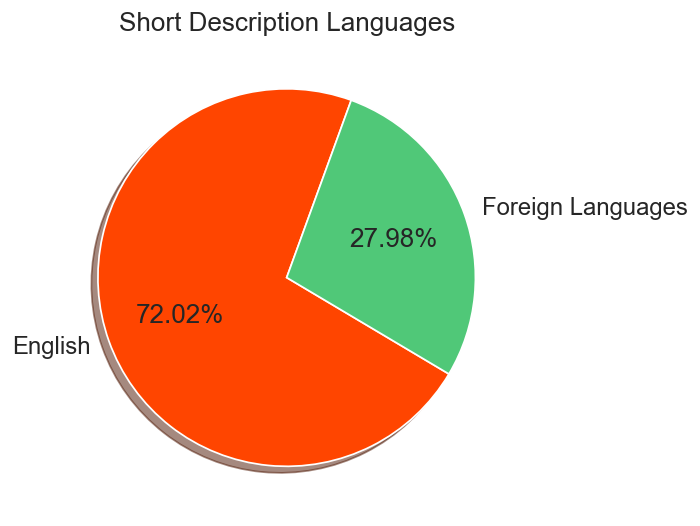

In [93]:
sns.set(font_scale=1.25)  # scale up font size

plt.figure(figsize=(5, 5), dpi=125)
eng = freq_df.loc['en'].tolist()[0]
foreign_lang = len(dataset) - freq_df.loc['en'].tolist()[0]

plt.pie(x=[eng, foreign_lang],
        explode=(0, 0),
        labels=['English', 'Foreign Languages'],
        autopct='%1.2f%%',
        shadow=True,
        startangle=70,
        colors=['#FF4500', '#50C878'])

fig = plt.gcf()
fig.set_size_inches(5, 5)
plt.title('Short Description Languages')
plt.show()

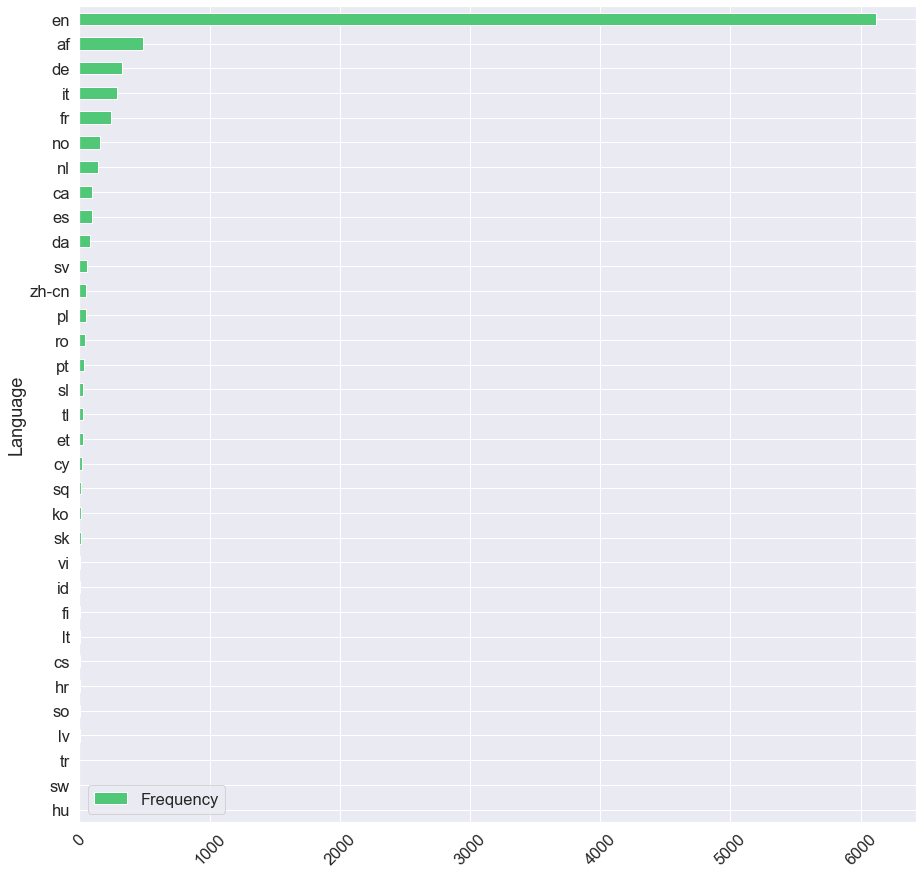

In [94]:
sns.set(font_scale=1.5)  # scale up font size
freq_df.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=0.5, figsize=(15, 15), color='#50C878')
plt.xticks(rotation=45)
plt.show()

In [95]:
# for i in lang_samples:
#     print(i)
#     try:
#         print(random.sample(lang_samples[i], 3))
#     except Exception:
#         print(random.sample(lang_samples[i], 1))
#     print('')

In [96]:
errs  # few errors where lang_detect failed, need to impute these irrelevant values

['+86  ', 'bgflmyar.xgufkidq@gmail.com', '???????????????????']

In [97]:
dataset[dataset.description == errs[0]]

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins
6253,in the inbox always show there are several ema...,+86,mqbxwpfn uclrqfxa,GRP_0,5,1,94,19,,inbox always show,0,0


In [98]:
dataset.loc[dataset.description == errs[0], 'description'] = dataset[dataset.description == errs[0]].short_description

In [99]:
dataset[dataset.short_description == errs[1]]

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins
1836,bgflmyar.xgufkidq@gmail.com,bgflmyar.xgufkidq@gmail.com wanted to check if...,olckhmvx pcqobjnd,GRP_0,83,13,27,1,tool on his phone,,0,10


In [100]:
dataset.loc[dataset.short_description == errs[1], 'short_description'] = dataset[dataset.short_description == errs[1]].description

In [101]:
dataset[dataset.short_description == errs[2]]

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins
2975,???????????????????,\n\nreceived from: yzbjhmpw.vzrulkog@gmail.com...,yzbjhmpw vzrulkog,GRP_0,1207,131,19,1,company shared services gmbh geschäftsführer,,0,62


In [102]:
dataset.loc[dataset.short_description == errs[2], 'short_description'] = dataset[dataset.short_description == errs[2]].description

In [103]:
def clean_incosistencies():
    dataset.loc[dataset.description == errs[0], 'description'] = dataset[dataset.description == errs[0]].short_description
    dataset.loc[dataset.short_description == errs[1], 'short_description'] = dataset[dataset.short_description == errs[1]].description
    dataset.loc[dataset.short_description == errs[2], 'short_description'] = dataset[dataset.short_description == errs[2]].description

# clean_incosistencies()

<h2><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Pre-Processing</span></strong></li>
</ul></h2>

In [104]:
dataset

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,206,33,11,2,verified user details.,login issue,0,22
1,outlook,\n\nreceived from: hmjdrvpb.komuaywn@gmail.com...,hmjdrvpb komuaywn,GRP_0,194,25,7,1,appearing in my outlook calendar,outlook,0,21
2,cant log in to vpn,\n\nreceived from: eylqgodm.ybqkwiam@gmail.com...,eylqgodm ybqkwiam,GRP_0,87,11,18,5,log on to vpn,log in to vpn,0,10
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,29,5,29,5,tool page,tool page,0,3
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,12,2,12,2,skype error,skype error,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
8495,emails not coming in from zz mail,\n\nreceived from: avglmrts.vhqmtiua@gmail.com...,avglmrts vhqmtiua,GRP_29,141,19,33,7,good afternoon,emails not coming,22,16
8496,telephony_software issue,telephony_software issue,rbozivdq gmlhrtvp,GRP_0,24,2,24,2,software issue,software issue,0,2
8497,vip2: windows password reset for tifpdchb pedx...,vip2: windows password reset for tifpdchb pedx...,oybwdsgx oxyhwrfz,GRP_0,50,7,50,7,windows password reset for tifpdchb,windows password reset for tifpdchb,0,6
8498,machine não está funcionando,i am unable to access the machine utilities to...,ufawcgob aowhxjky,GRP_62,103,17,30,4,finish the drawers adjustment settings.,machine não está funcionando,59,12


### Pipeline
* fix text encoding usng ftfy.fix_text
* handle other languages (drop or translate) (TODO)
* parse email messages to retain only subject and body
* clean up emails, links, website links, telephone numbers
* clean up anchor words like: 'Received from:', 'name:', 'hello', 'hello team' , 'cid' ...
* clean up security logs (TODO)
* clean up outage questionnaires (TODO)
* clean html tags if they exist
* clean /r /n characters
* strip caller names in descriptions
* translate accented characters (á -> a)
* convert unicode characters to ascii
* expand contractions (they're -> they are)
* clean stopwords & any custom stopwords
* clean up extra whitespaces & tokenize
* remove gibberish (after language translation)
* strip extra punctuation
* lemmatization/stemming (if needed for a model)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">TODO: Language Translation</span></strong></li>
</ul></h3>

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">TODO: Outage Questionnaires</span></strong></li>
</ul></h3>

In [105]:
outage_df = dataset.reset_index().loc[pd.Series(['outage' in i for i in  dataset.description.tolist()])]

In [106]:
outage_df.group.value_counts()

GRP_8     139
GRP_4      16
GRP_0       8
GRP_16      1
Name: group, dtype: int64

In [107]:
outage_df

,index,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins
78,78,"power outage:UK al, 1st and 5th ave sites hard...",what type of outage: _____network _____ci...,mnlazfsr mtqrkhnx,GRP_8,1197,132,82,17,type of outage,ave sites hard,72,61
79,79,"power outage : germany, mx: site is hard down ...",what type of outage: ___x__network _____c...,jyoqwxhz clhxsoqy,GRP_8,1156,129,74,14,type of outage,power outage,72,59
189,189,network outage: india: site hard down since at...,what type of outage: __x___network _____c...,mnlazfsr mtqrkhnx,GRP_8,1163,130,86,16,type of outage,network outage,72,60
215,215,network outage - warehouse: node company-ups-...,what type of outage: __x___network _____c...,jyoqwxhz clhxsoqy,GRP_8,1152,128,80,11,type of outage,network outage,72,59
240,240,power outage :australia australia: site hard d...,what type of outage: __x___network _____c...,utyeofsk rdyzpwhi,GRP_8,1167,132,78,13,type of outage,power outage,72,60
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8097,8098,"network outage, russia ru, company-russia-vpn-...",what type of outage: _x____network _____c...,uxgrdjfc kqxdjeov,GRP_8,1172,130,123,16,type of outage,network outage,72,60
8184,8185,"circuit outage: vogelfontein, south africa mpl...",what type of outage: _____network ___x__c...,jyoqwxhz clhxsoqy,GRP_8,1158,130,86,15,type of outage,south africa mpls circuit,72,60
8272,8273,network outage : south amerirtca(argentina) si...,what type of outage: ____x_network _____c...,vbwszcqn nlbqsuyv,GRP_8,1148,129,88,14,type of outage,network outage,72,59
8274,8275,network outage: usa site is hard down since 05...,what type of outage: _x____network _____c...,vbwszcqn nlbqsuyv,GRP_8,1152,130,65,13,type of outage,usa site is hard,72,59


In [108]:
outage_df.group.value_counts()

GRP_8     139
GRP_4      16
GRP_0       8
GRP_16      1
Name: group, dtype: int64

In [109]:
print(outage_df.description.tolist()[0])

what type of outage:  _____network     _____circuit     ___x__power (please specify what type of outage)

1. top 23 cert site   ?    ___yes______     (yes/no/na) 

2. when did it start  ?   ________4:31 pm et on 10/30. _____________

3.  scheduled maintenance ( power) ? __yno_____    (yes/no/na)     company power  _________     provider power _________
                
4.  scheduled maintenance ( network) ? ___no____    (yes/no/na)     company maint________ (yes/no)       provider maint/ticket #__________________    

5. does site have a backup circuit ?  __yes____    (yes/no/na) 

6. backup circuit active ?   ___na_____     (yes/no/na) 

7. site contact notified (phone/email) ?  _________     (yes/no/na) 

8. remote dial-in ?   ____na_______   (yes/no/na) 

9. equipment reset ?    ____na_______    (yes/no/na) 

10. verified site working on backup circuit ?  ___na____     (yes/no/na) 

11. vendor ticket  # ( global_telecom_1, verizon, telecom_vendor_1, telecom_vendor_2 )    ____global_

In [110]:
outage_df

,index,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins
78,78,"power outage:UK al, 1st and 5th ave sites hard...",what type of outage: _____network _____ci...,mnlazfsr mtqrkhnx,GRP_8,1197,132,82,17,type of outage,ave sites hard,72,61
79,79,"power outage : germany, mx: site is hard down ...",what type of outage: ___x__network _____c...,jyoqwxhz clhxsoqy,GRP_8,1156,129,74,14,type of outage,power outage,72,59
189,189,network outage: india: site hard down since at...,what type of outage: __x___network _____c...,mnlazfsr mtqrkhnx,GRP_8,1163,130,86,16,type of outage,network outage,72,60
215,215,network outage - warehouse: node company-ups-...,what type of outage: __x___network _____c...,jyoqwxhz clhxsoqy,GRP_8,1152,128,80,11,type of outage,network outage,72,59
240,240,power outage :australia australia: site hard d...,what type of outage: __x___network _____c...,utyeofsk rdyzpwhi,GRP_8,1167,132,78,13,type of outage,power outage,72,60
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8097,8098,"network outage, russia ru, company-russia-vpn-...",what type of outage: _x____network _____c...,uxgrdjfc kqxdjeov,GRP_8,1172,130,123,16,type of outage,network outage,72,60
8184,8185,"circuit outage: vogelfontein, south africa mpl...",what type of outage: _____network ___x__c...,jyoqwxhz clhxsoqy,GRP_8,1158,130,86,15,type of outage,south africa mpls circuit,72,60
8272,8273,network outage : south amerirtca(argentina) si...,what type of outage: ____x_network _____c...,vbwszcqn nlbqsuyv,GRP_8,1148,129,88,14,type of outage,network outage,72,59
8274,8275,network outage: usa site is hard down since 05...,what type of outage: _x____network _____c...,vbwszcqn nlbqsuyv,GRP_8,1152,130,65,13,type of outage,usa site is hard,72,59


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">TODO: Security/Event Logs</span></strong></li>
</ul></h3>

In [111]:
dataset.reset_index().loc[pd.Series(['source ip' in i for i in  dataset.description.tolist()])]  # all security incident logs

,index,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins
341,341,security incidents - ( #in33071122 ) :[ipbl]: ...,source ip :\nsystem name :lmsl9516338\nuser n...,gzhapcld fdigznbk,GRP_3,166,30,87,13,updates field sales user,security incidents,23,18
2977,2978,security incidents - ( #in33987594) : 29866 vi...,source ip :\nsystem name :\nuser name:\nlocat...,gzhapcld fdigznbk,GRP_3,3249,316,115,17,"den dolder,nld devip",bare http get executable,23,80
3096,3097,security incidents - ( #in33976733) : suspicio...,source ip: 10.16.90.249\nsource hostname: andr...,gzhapcld fdigznbk,GRP_56,6887,703,104,11,deny udp src inside,security incidents,52,88
3097,3098,security incidents - ( #in33984033) : internal...,source ip :\nsystem name :\nuser name:\nlocat...,gzhapcld fdigznbk,GRP_19,6868,687,96,13,deny udp src inside,internal outbreak for port,11,88
3529,3530,security incidents - ( #in33944691 ) : possibl...,source ip: 195.272.28.222\nsource port: 80\nso...,gzhapcld fdigznbk,GRP_2,7524,974,111,17,found field sales user,traffic from sinkhole domain,12,90
3531,3532,security incidents - ( #in33944327) :possible ...,source ip :\nsystem name :\nuser name:\nlocat...,gzhapcld fdigznbk,GRP_2,3628,451,109,15,probable infected asset occurrence count,traffic from sinkhole domain,12,82
3704,3705,security incidents - ( #in33932723 ) : possibl...,source ip: 10.44.63.52\nsource hostname: leeng...,gzhapcld fdigznbk,GRP_48,3235,387,105,14,daserf backdoor phoning home,security incidents,43,80
3705,3706,security incidents - ( #in33924718 ) : possibl...,source ip :195.22.28.222\ndestination ip: 12.9...,gzhapcld fdigznbk,GRP_2,4286,536,116,17,probable infected asset occurrence count,traffic from sinkhole domain,12,85
3960,3961,security incidents - ( #in33805815) : possible...,=========================\nevent data\n=======...,gzhapcld fdigznbk,GRP_2,3734,476,110,16,probable infected asset occurrence count,traffic from sinkhole domain,12,83
3964,3965,security incidents - ( #in33809307 ) : possibl...,source ip :195.22.28.222 \nsystem name :androi...,gzhapcld fdigznbk,GRP_2,8988,1255,116,17,servers for each domain,traffic from sinkhole domain,12,92


In [112]:
dataset.reset_index().loc[pd.Series(['source ip' in i for i in  dataset.description.tolist()])].group.value_counts()  # groups

GRP_2     26
GRP_12     4
GRP_3      4
GRP_39     4
GRP_62     2
GRP_47     1
GRP_69     1
GRP_30     1
GRP_19     1
GRP_48     1
GRP_56     1
GRP_0      1
GRP_31     1
Name: group, dtype: int64

In [113]:
dataset.reset_index().loc[pd.Series(['cyber' in i for i in  dataset.short_description.tolist()])]

,index,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins
491,491,october cyber security month - ransomware,october cyber security month - ransomware,pyrtfdxu nxfkqmoy,GRP_0,42,6,42,6,october cyber security month,october cyber security month,0,5
1729,1729,cyber security - phish uacyltoe hxgaycze repor...,cyber security - phish uacyltoe hxgaycze repor...,ugyothfz ugrmkdhx,GRP_2,60,9,60,9,phish uacyltoe hxgaycze report october,phish uacyltoe hxgaycze report october,12,7
5411,5412,cyber security - phish uacyltoe hxgaycze repor...,cyber security - phish uacyltoe hxgaycze repor...,ugyothfz ugrmkdhx,GRP_2,62,9,62,9,phish uacyltoe hxgaycze report september,phish uacyltoe hxgaycze report september,12,7


### TODO: dig deeper into security logs and cyber security issues handled by 2, 39, 12, ...

In [114]:
import re
from collections import Counter

def remove_duplicates(text: str) -> str:
    '''Remove duplicates'''
    text = text.split(" ")
    for i in range(0, len(text)):
        text[i] = "".join(text[i])
    UniqW = Counter(text)
    text = " ".join(UniqW.keys())
    return str(text)

# remove_duplicates(text)

In [115]:
log = dataset.reset_index().loc[pd.Series(['source ip' in i for i in  dataset.description.tolist()])].iloc[1].description
print(log)

source ip :
system name :
user  name:
location :
sep , sms status :
field sales user ( yes / no) :  
dsw event log:
-------------------------------------------------------------------------------------------------------------------
event detail(s):

event_id 417013204:
[**] [1:21130977:10] 29866 vid22518 bare http get executable from ip address (possible downloader trojan) [**]
[classification: none] [priority: 2] [action: accept_passive] [impact_flag: 0] [impact: 0] [blocked: 2] [vlan: 0] [mpls label: 0] [pad2: 1]
[sensor id: 602982][event id: 281895][time: 2585087487.272206]
[xref => vid, 22518]
[src ip: 10.1.43.79][dst ip: 94.102.53.238][sport/itype: 61007][dport/icode: 80][proto: 6]
09/27/2016-11:39:36.272206 10.1.43.79:61007 -> 94.102.53.238:80
tcp ttl:127 tos:0x0 id:16297 iplen:20 dgmlen:119 df
***ap*** seq: 0xfbc9dc8c ack: 0xe57c9433 win: 0x102 tcplen: 20
==pcap s==
=0c=00=00=00xz=eawn'=04=00w=00=00=00w=00=00=00e=00=00w?=a9@=00=7f=06=f23=0a=01+o^f5=ee=eeo=00p=fb=c9=dc=8c=e5|=943

In [116]:
def clean_sec_logs(text: str) -> str:
    '''Clean up security logs'''
    if text.startswith('source ip'):
        words = set(['source','ip','hostname', 'mac', 'events', 'yes / no'])
        word_cleanup = r'\b(?:{})\b'.format('|'.join(words))
        text = text.replace('\n', ' ').replace('\r', '')
        text = re.sub(r'((:)?\s?\d+(.|:)?)+', '', text)
        text = re.sub('(_x000D_|_x_|_x|x_)', '', text)
        text = re.sub(r'(\[|\]|(\-)+|(\=)+|\%|\,|\"|\:|\(|\))?','', text)
        text = re.sub(word_cleanup,'', text)
        text = remove_duplicates(text)
    return str(text)

clean_sec_logs(log)

" system name user location sep sms status field sales dsw event log details event_id ** vidbare http get executable from address possible downloader trojan classification none priority action accept_passive impact_flag impact blocked vlan mpls label pad sensor idevent idtime xref > vid src ipdst ipsport/itypedport/icodeproto>tcp ttltosidiplendgmlendf ***ap*** seqfbcc ackewintcplenpcap s zeawn'?afo^feeeeofbcdcedet /~yahoo/csrsv.exe http/hostconnection keepalive pcap e ex http_uri http_hostname osecurity correlation_data sepdhcpd dhcpack onto cfelhql via ethrelayleasedurationrenew lowercaseurlcorrelation srcip urlcorrelation vendorreference vidforeseeconndirection outgoing refererproxycorrelationurl null foreseeexternalip eventtypeid unique_event_hash ontologyid foreseeinternalip urlpath srchostname lhqlinspectorruleid inspectoreventid httpmethod netacuity_destination_organization ecatel ltd vendoreventid device_id foreseemaliciousprobability event_summary tcpflags agentid lhqlcvss fore

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Parse Emails</span></strong></li>
</ul></h3>

In [117]:
# !pip -q installmail-parser
import re
import email
import spacy
import mailparser
from utils.utils import clean_text, is_blank, is_not_blank
from utils.email_handler import email_regex
from charset_normalizer import from_bytes
from utils.email_handler import EmailHandler

nlp = spacy.load('en_core_web_sm', disable=['parser'])

* detect emails in description

In [118]:
email_hdlr = EmailHandler()
emails_df = defaultdict(list)

for idx, row in tqdm(dataset.iterrows()):
    doc = nlp(row.description)
    toks = [t.text for t in doc]
    toks = [t.strip() for t in toks]
    text = " ".join(toks)
    tags = ['O']*len(doc)
    tag = "MAIL"
    email_indices = email_hdlr.match_ref(text, toks, tags,
                                         entity=tag,
                                         verbose=False)
    # if email is present add to accum
    if email_indices:
        row = dict(row)
        for i in row:
            emails_df[i].append(row[i])

emails_df = pd.DataFrame(dict(emails_df))

8499it [01:52, 75.32it/s] 


In [119]:
emails_df  # 2616 rows with an email id in description

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins
0,outlook,\n\nreceived from: hmjdrvpb.komuaywn@gmail.com...,hmjdrvpb komuaywn,GRP_0,194,25,7,1,appearing in my outlook calendar,outlook,0,21
1,cant log in to vpn,\n\nreceived from: eylqgodm.ybqkwiam@gmail.com...,eylqgodm ybqkwiam,GRP_0,87,11,18,5,log on to vpn,log in to vpn,0,10
2,unable to login to company vpn,"\n\nreceived from: xyz@company.com\n\nhi,\n\ni...",chobktqj qdamxfuc,GRP_0,244,44,30,6,login to company vpn website,unable to login to company,0,25
3,vpn issue,\n\nreceived from: ugephfta.hrbqkvij@gmail.com...,ugephfta hrbqkvij,GRP_0,473,68,9,2,connect vpn from home office,vpn issue,0,40
4,vpn not working,\n\nreceived from: dceoufyz.saufqkmd@gmail.com...,dceoufyz saufqkmd,GRP_0,206,33,15,3,company network through the vpn,vpn not working,0,22
...,...,...,...,...,...,...,...,...,...,...,...,...
2611,customer group enhanced field,\n\nreceived from: nlearzwi.ukdzstwi@gmail.com...,nlearzwi ukdzstwi,GRP_9,598,81,29,4,business decision has recently,customer group enhanced field,73,45
2612,ess portal,\n\nreceived from: eagvusbr.nguqityl@gmail.com...,eagvusbr nguqityl,GRP_9,331,51,10,2,ess file and checking,ess portal,73,32
2613,erp account unlock,name:mfeyouli ndobtzpw\nlanguage:\nbrowser:mic...,rbozivdq gmlhrtvp,GRP_0,197,19,18,3,microsoft internet explorer email,erp account unlock,0,21
2614,vpn for laptop,\n\nreceived from: jxgobwrm.qkugdipo@gmail.com...,jxgobwrm qkugdipo,GRP_34,216,20,14,3,vpn for my new laptop,vpn for laptop,28,23


In [120]:
def parse_body(msg: str, encoding='utf-8'):
    b = email.message_from_string(msg)
    body = ""

    if b.is_multipart():
        for part in b.walk():
            ctype = part.get_content_type()
            cdispo = str(part.get('Content-Disposition'))

            # skip any text/plain (txt) attachments
            if ctype == 'text/plain' and 'attachment' not in cdispo:
                body = part.get_payload(decode=True)  # decode
                break

    # not multipart - i.e. plain text & no attachments
    else:
        # print('Plain Text')
        body = b.get_payload(decode=True)

    subject_matches =  re.findall('subject:.*\n', test)
    if subject_matches:
        subject = subject_matches[0]
    else:
        subject = b.get_all('subject')

    if not isinstance(subject, str):
        subject = ''
    
    # print("Subject: ", subject)
    # print("Body: ", body)

    body = str(from_bytes(body).best())
    # body = str(body, encoding)

    parsed_msg = str(subject + body)
    if is_blank(parsed_msg):
        # return original message if no payload is found after parsing
        return msg
    return parsed_msg

In [121]:
msgs = list(set(emails_df.description.tolist()))
msgs = [i for i in msgs if 'to:' in i]
len(msgs)

303

In [122]:
test = msgs[20]

print(test)
print('\nParsed:')
print(parse_body(test))



received from: ptuchwad.yzvrlcqa@gmail.com

hallo

kann auf rechner outlook nicht starten und crm synchronisiert stundenlang
dadurch werden auch andere dinge geblockt ( engineering_tool z.b.)

bitte um hilfe - sitze am rechner



mit freundlichen grüssen
-uwe schröck
technische beratung und verkauf
ptuchwad.yzvrlcqa@gmail.com<mailto:ptuchwad.yzvrlcqa@gmail.com>
mobil 0175 4356 741<tel:0175%204356%20741>

company deutschland gmbh / max-planck-straße 13 / d-61381 germany /www.company.com<

company deutschland gmbh
geschäftsführer: rfwlsoej yvtjzkaw, harald männlein
sitz der gesellschaft: germany/hgermany – registergerirtcht: bad homburg/hgermany  hrb 7492




diese mitteilung ist einzig und allein für die nutzung durch den adressaten bestimmt und kann informationen enthalten, die schutzwürdig, vertraulich oder nach geltendem recht von der offenlegung ausgenommen sind. die verbreitung, verteilung oder vervielfältigung dieser mitteilung durch personen, bei denen es sich nicht um die beab

In [123]:
def strip_headers(text: str) -> str:
    '''strip headers in email messages like: "received from: xyz@gmail.com"'''
    patterns = list()
    patterns.append(r'received from:?\s?' + email_regex)
    patterns.append(r'from:?\s?' + email_regex)
    patterns.append(r'email:?\s?' + email_regex)
    patterns.append(r'to:?\s?' + email_regex)
    patterns.append(r'to:\s')
    patterns.append(r'sent:\s.*[ap]m')
    patterns.append(r'customer number:')
    patterns.append(r'summary:')
    patterns.append(r'subject:')
    patterns.append(r'telephone:')
    patterns.append(r'regional controller')
    patterns.append(r'<mail>')
    patterns.append(r'help desk,')
    patterns.append(r'it team,')
    patterns.append(r'global it team,')
    patterns.append(r'\nbest\n')
    patterns.append(r'\nregards\n')
    patterns.append(r'\[cid:?.*\]')  # attachments link
    
    # patterns.append(r'subject:?.*\b')
    patterns = [re.compile(p) for p in patterns]
    for pattern in patterns:
        text = re.sub(pattern, '', text.strip()).strip()
    return str(text.strip())

print(strip_headers(test))

hallo

kann auf rechner outlook nicht starten und crm synchronisiert stundenlang
dadurch werden auch andere dinge geblockt ( engineering_tool z.b.)

bitte um hilfe - sitze am rechner



mit freundlichen grüssen
-uwe schröck
technische beratung und verkauf
ptuchwad.yzvrlcqa@gmail.com
mobil 0175 4356 741<tel:0175%204356%20741>

company deutschland gmbh / max-planck-straße 13 / d-61381 germany /www.company.com<

company deutschland gmbh
geschäftsführer: rfwlsoej yvtjzkaw, harald männlein
sitz der gesellschaft: germany/hgermany – registergerirtcht: bad homburg/hgermany  hrb 7492




diese mitteilung ist einzig und allein für die nutzung durch den adressaten bestimmt und kann informationen enthalten, die schutzwürdig, vertraulich oder nach geltendem recht von der offenlegung ausgenommen sind. die verbreitung, verteilung oder vervielfältigung dieser mitteilung durch personen, bei denen es sich nicht um die beabsichtigten empfänger handelt, ist streng verboten. wenn diese mitteilung aufgrund 

In [124]:
def parse_email(msg: str) -> str:
    '''parses and cleans email messages'''
    doc = nlp(msg)
    toks = [t.text for t in doc]
    toks = [t.strip() for t in toks]
    text = " ".join(toks)
    tags = ['O']*len(doc)
    tag = "MAIL"
    email_indices = email_hdlr.match_ref(text, toks, tags,
                                         entity=tag,
                                         verbose=False)
    if email_indices:
        msg = parse_body(msg)
        msg = strip_headers(msg)
    return msg

def parse_email_row(row):
    descr = row.description
    short_descr = row.short_description
    # text_normalized = str(from_bytes(text.encode('utf-8')).best())
    row['cleaned_short_description'] = parse_email(short_descr)
    row['cleaned_description'] = parse_email(descr)
    return row

print(parse_email(test))

hallo

kann auf rechner outlook nicht starten und crm synchronisiert stundenlang
dadurch werden auch andere dinge geblockt ( engineering_tool z.b.)

bitte um hilfe - sitze am rechner



mit freundlichen grüssen
-uwe schröck
technische beratung und verkauf
ptuchwad.yzvrlcqa@gmail.com
mobil 0175 4356 741<tel:0175%204356%20741>

company deutschland gmbh / max-planck-straße 13 / d-61381 germany /www.company.com<

company deutschland gmbh
geschäftsführer: rfwlsoej yvtjzkaw, harald männlein
sitz der gesellschaft: germany/hgermany \u2013 registergerirtcht: bad homburg/hgermany  hrb 7492




diese mitteilung ist einzig und allein für die nutzung durch den adressaten bestimmt und kann informationen enthalten, die schutzwürdig, vertraulich oder nach geltendem recht von der offenlegung ausgenommen sind. die verbreitung, verteilung oder vervielfältigung dieser mitteilung durch personen, bei denen es sich nicht um die beabsichtigten empfänger handelt, ist streng verboten. wenn diese mitteilung aufg

In [125]:
emails_df = emails_df.progress_apply(parse_email_row, axis=1)
emails_df.to_csv('./data/cleaned_emails_test.csv', index=None)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2616/2616 [01:28<00:00, 29.50it/s]


In [126]:
emails_df

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins,cleaned_short_description,cleaned_description
0,outlook,\n\nreceived from: hmjdrvpb.komuaywn@gmail.com...,hmjdrvpb komuaywn,GRP_0,194,25,7,1,appearing in my outlook calendar,outlook,0,21,outlook,"hello team,\n\nmy meetings/skype meetings etc ..."
1,cant log in to vpn,\n\nreceived from: eylqgodm.ybqkwiam@gmail.com...,eylqgodm ybqkwiam,GRP_0,87,11,18,5,log on to vpn,log in to vpn,0,10,cant log in to vpn,hi\n\ni cannot log on to vpn\n\nbest
2,unable to login to company vpn,"\n\nreceived from: xyz@company.com\n\nhi,\n\ni...",chobktqj qdamxfuc,GRP_0,244,44,30,6,login to company vpn website,unable to login to company,0,25,unable to login to company vpn,"hi,\n\ni am unable to login to company vpn web..."
3,vpn issue,\n\nreceived from: ugephfta.hrbqkvij@gmail.com...,ugephfta hrbqkvij,GRP_0,473,68,9,2,connect vpn from home office,vpn issue,0,40,vpn issue,hello helpdesk\n\ni am not able to connect vpn...
4,vpn not working,\n\nreceived from: dceoufyz.saufqkmd@gmail.com...,dceoufyz saufqkmd,GRP_0,206,33,15,3,company network through the vpn,vpn not working,0,22,vpn not working,"hello,\n\ni'm not being able to connect to com..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2611,customer group enhanced field,\n\nreceived from: nlearzwi.ukdzstwi@gmail.com...,nlearzwi ukdzstwi,GRP_9,598,81,29,4,business decision has recently,customer group enhanced field,73,45,customer group enhanced field,"hello,\n\na business decision has recently bee..."
2612,ess portal,\n\nreceived from: eagvusbr.nguqityl@gmail.com...,eagvusbr nguqityl,GRP_9,331,51,10,2,ess file and checking,ess portal,73,32,ess portal,"hi team,\n\ni was going into the ess file and ..."
2613,erp account unlock,name:mfeyouli ndobtzpw\nlanguage:\nbrowser:mic...,rbozivdq gmlhrtvp,GRP_0,197,19,18,3,microsoft internet explorer email,erp account unlock,0,21,erp account unlock,unlock erp account for gadbpfrz unvdyask user ...
2614,vpn for laptop,\n\nreceived from: jxgobwrm.qkugdipo@gmail.com...,jxgobwrm qkugdipo,GRP_34,216,20,14,3,vpn for my new laptop,vpn for laptop,28,23,vpn for laptop,i need a vpn for my new laptop. name llv851741...


In [127]:
for msg in random.sample(msgs, 10):
    print(msg)
    print("Cleaned:")
    print(parse_email(msg))
    print('~'*200)



received from: eqwaiphc.qxwfeuth@gmail.com

could you please advise what steps i should take to allow the attached spreadsheet to refresh data from crm?   below is the error message that i get when i open and enable content.

[cid:image001.jpg@01d1fc45.6ce205f0]

mictbdhryhle w.  burnhntyham
regional key account manager – msc east coast
eqwaiphc.qxwfeuth@gmail.com<mailto:eqwaiphc.qxwfeuth@gmail.com>

Cleaned:
could you please advise what steps i should take to allow the attached spreadsheet to refresh data from crm?   below is the error message that i get when i open and enable content.



mictbdhryhle w.  burnhntyham
regional key account manager \u2013 msc east coast
eqwaiphc.qxwfeuth@gmail.com
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


received from: koahsriq.wdugqatr@gmail.com

hello,
the account nikulatrhdy is "currently l

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Clean up caller ids in description</span></strong></li>
</ul></h3>

In [128]:
uniq_callers = set(dataset.caller.tolist())
len(uniq_callers)

2950

In [129]:
from pandas.core.common import flatten
callers_tokens = set(flatten([i.split() for i in uniq_callers]))
len(callers_tokens)

5900

In [130]:
def clean_callers(text: str, callers_tokens=callers_tokens) -> str:
    '''strips out caller ids from the descriptions'''
    return ' '.join([w for w in text.split()  if w.lower() not in callers_tokens])

test = '''yfqoaepn xnezhsit
managing director
finance manager cee
'''

clean_callers(test)

'managing director finance manager cee'

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Clean Irrelevant Information</span></strong></li>
</ul></h3>

* Clean up Emails, Links, Dates, Telephone Numbers

In [131]:
# !pip -q installspacy
# !python -m spacy downlaod en_core_web_sm
# !pip -q installcontractions
import nltk
import spacy

nltk.download('punkt')
nltk.download('stopwords')
# Initialize spacy 'en_core_web_sm' model
nlp = spacy.load('en_core_web_sm', disable=['parser'])

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\surya\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\surya\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [132]:
from utils.link_handler import LinkHandler
from utils.email_handler import EmailHandler
from utils.date_handler import DateHandler
from utils.tel_handler import TelHandler

In [133]:
test = "Date: 12/2/2024" 
doc = nlp(test)
toks = [t.text for t in doc]
toks = [t.strip() for t in toks]
text = " ".join(toks)
tags = ['O']*len(doc)
tag = "DATE"
date_hdlr = DateHandler()
date_indices = date_hdlr.match_ref(text, toks, tags,
                                   entity=tag,
                                   verbose=True)
tags = ['DATE' if idx in date_indices else 'O'
        for idx in range(len(toks))]
print(text)
print(toks)
print(tags)
pprint(list(zip(toks, tags)), compact=True)


Final Matches DATE: ['12/2/2024']

Date : 12/2/2024
['Date', ':', '12/2/2024']
['O', 'O', 'DATE']
[('Date', 'O'), (':', 'O'), ('12/2/2024', 'DATE')]


In [134]:
test = "mailto: john.doe@gmail.com from: jane.doe@outlook.com"
doc = nlp(test)
toks = [t.text for t in doc]
toks = [t.strip() for t in toks]
text = " ".join(toks)
tags = ['O']*len(doc)
tag = "MAIL"
email_hdlr = EmailHandler()
email_indices = email_hdlr.match_ref(text, toks, tags,
                                     entity=tag,
                                     verbose=True)
tags = [tag if idx in email_indices else 'O'
        for idx in range(len(toks))]
print(text)
print(toks)
print(tags)
pprint(list(zip(toks, tags)), compact=True)


Final Matches MAIL: ['john.doe@gmail.com', 'jane.doe@outlook.com']

mailto : john.doe@gmail.com from : jane.doe@outlook.com
['mailto', ':', 'john.doe@gmail.com', 'from', ':', 'jane.doe@outlook.com']
['O', 'O', 'MAIL', 'O', 'O', 'MAIL']
[('mailto', 'O'), (':', 'O'), ('john.doe@gmail.com', 'MAIL'), ('from', 'O'),
 (':', 'O'), ('jane.doe@outlook.com', 'MAIL')]


In [135]:
test = "www.google.com/?search Search Results: ..." 
doc = nlp(test)
toks = [t.text for t in doc]
toks = [t.strip() for t in toks]
text = " ".join(toks)
tags = ['O']*len(doc)
tag = "LINK"
link_hdlr = LinkHandler()
link_indices = link_hdlr.match_ref(text, toks, tags,
                                   entity=tag,
                                   verbose=True)
tags = [tag if idx in link_indices else 'O'
        for idx in range(len(toks))]
print(text)
print(toks)
print(tags)
pprint(list(zip(toks, tags)), compact=True)


Final Matches LINK: ['www.google.com/?search']

www.google.com/?search Search Results : ...
['www.google.com/?search', 'Search', 'Results', ':', '...']
['LINK', 'O', 'O', 'O', 'O']
[('www.google.com/?search', 'LINK'), ('Search', 'O'), ('Results', 'O'),
 (':', 'O'), ('...', 'O')]


In [136]:
test = "Tel +1 724 539 5257" 
doc = nlp(test)
toks = [t.text for t in doc]
toks = [t.strip() for t in toks]
text = " ".join(toks)
tags = ['O']*len(doc)
tag = "TEL"
tel_hdlr = TelHandler()
tel_indices = tel_hdlr.match_ref(text, toks, tags,
                                 entity=tag,
                                 verbose=True)
tags = [tag if idx in tel_indices else 'O'
        for idx in range(len(toks))]
print(text)
print(toks)
print(tags)
pprint(list(zip(toks, tags)), compact=True)


Final Matches TEL: ['Tel', '+1', '724', '539', '5257']

Tel +1 724 539 5257
['Tel', '+1', '724', '539', '5257']
['TEL', 'TEL', 'TEL', 'TEL', 'TEL']
[('Tel', 'TEL'), ('+1', 'TEL'), ('724', 'TEL'), ('539', 'TEL'), ('5257', 'TEL')]


In [137]:
def clean_irrelevant_info(text: str) -> str:
    '''strips out emails, dates, website links and telephone numbers in the text'''
    doc = nlp(text)
    toks = [t.text for t in doc]
    toks = [t.strip() for t in toks]
    text = " ".join(toks)
    tags = ['O']*len(doc)
    tel_indices = tel_hdlr.match_ref(text, toks, tags,
                                     entity='TEL',
                                     verbose=False)
    tags = ['TEL' if idx in tel_indices else 'O'
            for idx in range(len(toks))]
    link_indices = link_hdlr.match_ref(text, toks, tags,
                                       entity='LINK',
                                       verbose=False)
    tags = ['LINK' if idx in link_indices else tag
            for idx, tag in enumerate(tags)]
    date_indices = date_hdlr.match_ref(text, toks, tags,
                                       entity='DATE',
                                       verbose=False)
    tags = ['DATE' if idx in date_indices else tag
            for idx, tag in enumerate(tags)]
    email_indices = email_hdlr.match_ref(text, toks, tags,
                                         entity='MAIL',
                                         verbose=False)
    tags = ['MAIL' if idx in email_indices else tag
            for idx, tag in enumerate(tags)]
    # print(toks)
    # print(tags)
    # print([tok for tok, tag in zip(toks, tags) if tag == "O"])

    text = str(" ".join([tok for tok, tag in zip(toks, tags) if tag == "O"]))
    # Remove HTML special entities (e.g. &amp;)
    text = re.sub(r'\&\w*;', '', text)
    # Remove hyperlinks
    text = re.sub(r'https?:\/\/.*\/\w*', '', text)  
    return text

In [138]:
%%time

test = "Tel +1 724 539 5257 www.google.com/?search Search Results: ... Date: 12/2/2024 mailto: john.doe@gmail.com from: jane.doe@outlook.com"
clean_irrelevant_info(test)

Wall time: 7 ms


'Search Results : ... Date : mailto : from :'

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Clean Anchors</span></strong></li>
</ul></h3>

In [139]:
import re

anchors = ['received from:', 'received from :', 'received from:',
           'from:', 'to:', 'from :', 'to :',
           'date:', 'date :', 'cid', 'gentles,',
           '^hi', '^hello', '^hello,', '^hello ,', '^dear team',
           'good morning', 'good morning,' '^hi there', '^hi there,',
           'received from:?', 'hello helpdesk', 'best$',
           'hello', 'hi', 'employee', 'manager', 'etc', 'meetings', 'welcome',
           'please', 'pls', 'sir','mam', 'regards', 'jpg', 'image', 'fyi',
           'good', 'afternoon', 'morning', 'greetings',
          ]

# to strip out larger anchors first
anchors = sorted(list(set(anchors)), key=len, reverse=True)
anchors = [re.compile(a) for a in anchors]

def clean_anchors(text: str, anchors=anchors) -> str:
    '''strips out anchor words'''
    for anchor in anchors:
        text = re.sub(anchor, '', text.strip()).strip()
    return str(text.strip())

In [140]:
%%time
test = '''
hi there,

would you please help me unlock my supply_chain_software account and reset my supply_chain_software password? '''
clean_anchors(test)

Wall time: 0 ns


'would you  help me unlock my supply_chain_software account and reset my supply_chain_software password?'

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Gibberish Removal</span></strong></li>
</ul></h3>

In [141]:
import re
import nltk
from nltk.corpus import words
nltk.download('words')
vocab = set(nltk.corpus.words.words())

gib = set(['æ','¹','å','†ç','ï¼Œ','Ž','¥','Š','å','©','ç™','å½','ä','º','†','ã','€','æ','—','¶',"f³","‹","è","§",'¯åŠ¨å','¯åŠ¨å','Žé'])
gibb = r'\b(?:{})\b'.format('|'.join(gib))
def clean_gibberish(text: str) -> str:
    #gibb = r'\b(?:{})\b'.format('|'.join(gib))
    text=text.lower()
    # Remove hashtag while keeping hashtag text
    text = re.sub(r'#','', text)
    # replace '&' with 'and'
    text = re.sub(r'&;?', 'and', text)

    # Remove characters beyond Readable formart by Unicode:
    # text= ''.join(c for c in text if c <= '\uFFFF') 
    # text = text.strip()
    # Remove unreadable characters  (also extra spaces)
    text = ' '.join(re.sub("[^\u0030-\u0039\u0041-\u005a\u0061-\u007a]", " ", text).split())
    text = re.sub(r"\s+[a-zA-Z]\s+", ' ', text)
    text = re.sub(' +', ' ', text)
    text = re.sub('xd','',text)
    text = re.sub(gibb,'',text)
    return str(text.strip())


def clean_oov(text: str, vocab=vocab) -> str:
    '''strips out words that are outside the given vocabulary
       (exclude out-of-vocab tokens)'''
    text = " ".join([i for i in text.split() if i.lower() in vocab])
    return str(text.strip())

[nltk_data] Downloading package words to
[nltk_data]     C:\Users\surya\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


* General Preprocessing helper functions

In [142]:
# utility functions for text preprocesing
import string
import unicodedata
import contractions
from bs4 import BeautifulSoup
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.stem.snowball import SnowballStemmer

CUSTOM = True

stemmer = SnowballStemmer('english')
if CUSTOM:
    stop_words = set(nltk.corpus.stopwords.words('english'))
    # custom stopwords added from the most frequent words which are generic 
    # and might not relate to the sentiment of the review
    stop_words.update(['urllink', ])
else:
    stop_words = set(nltk.corpus.stopwords.words('english'))


def replace_accented_chars(text: str) -> str:
    '''normalizes and replaces accented characters'''
    unaccented_text = unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')
    return str(unaccented_text)


def strip_html_tags(text: str) -> str:
    '''strips html tags like <h4> ..etc'''
    soup = BeautifulSoup(text, "html.parser")
    [s.extract() for s in soup(['iframe', 'script'])]
    stripped_text = soup.get_text()
    stripped_text = re.sub(r'[\r|\n|\r\n]+', '\n', stripped_text)
    return str(stripped_text)


def expand_contractions(text: str) -> str:
    text = contractions.fix(text)
    return str(text)


def remove_special_characters(text: str) -> str:
    '''
    Remove special characters but preserve digits and excalamation marks
    as they indicate emotionally charged review '''
    text = re.sub(r"[^A-Za-z0-9!?\'\`]", " ", text)
    return str(text)


def strip_stops(text: str, is_lower_case=False, stop_words=stop_words) -> str:
    '''strip stopwrds'''
    tokens = text.split()
    tokens = [token.strip() for token in tokens]
    if is_lower_case:
        filtered_tokens = [token for token in tokens if token not in stop_words]
    else:
        filtered_tokens = [token for token in tokens if token.lower() not in stop_words]
    filtered_text = ' '.join(filtered_tokens)    
    return str(filtered_text)


def snowball_stem(text: str, stemmer=stemmer) -> str:
    '''stemming using snowball stemmer'''
    words = text.split()
    stemmed_words = [stemmer.stem(word) for word in words]
    text = " ".join(stemmed_words)
    return str(text)


def tokenize(text: str) -> str:
    '''tokenize using spaCy'''
    doc = nlp(text)
    return str(" ".join([t.text for t in doc]))


def lemmatize(text: str) -> str:
    '''lemmatize using spaCy'''
    doc = nlp(text)
    return str(" ".join([t.lemma_ for t in doc]))

In [143]:
def preprocess_text(text: str,
                    fix_encoding=True,
                    translate_to_english=True,
                    clean_security_logs=True,
                    clean_emails=True,
                    strip_irrelevant=True,
                    strip_anchors=True,
                    strip_callers=True,
                    clean_html_tags=True,
                    replace_accented=True,
                    remove_special=True,
                    strip_stopwords=True,
                    clean_whitespace=True,
                    tokenize_text=True,
                    remove_gibberish=True,
                    remove_oov=False,
                    lower=True,
                    get_lemmas=True)-> str:
    '''performs all preprocessing techniques in the pipeline on a string to return a cleaned string'''

    if fix_encoding:
        text = fix_text(text)
    
    # TODO
    if translate_to_english:
        pass
    
    if clean_security_logs:
        text = clean_sec_logs(text)

    if clean_emails:
        text = parse_email(text)

    if strip_irrelevant:
        text = clean_irrelevant_info(text)

    if strip_anchors:
        text = clean_anchors(text)

    if strip_callers:
        text = clean_callers(text)
    
    if clean_html_tags:
        text = strip_html_tags(text)
    
    if replace_accented:
        text = replace_accented_chars(text)
    text = expand_contractions(text)

    if remove_special:
        text = remove_special_characters(text)

    if strip_stopwords:
        text = strip_stops(text)
    
    if clean_whitespace:
        # remove extra whitespace between tokens
        text = ' '.join(text.split())
    
    if tokenize_text:
        text = tokenize(text)
    
    if remove_gibberish:
        text = clean_gibberish(text)
    
    if remove_oov:
        text = clean_oov(text)

    if lower:
        text = text.lower()

    if get_lemmas:
        text = lemmatize(text)

    return str(text.strip())

In [144]:
test = """
received from: phfduvwl.yqnaucep@gmail.com

hello
i failed to login my hpqc account and got below message.
could you please reset password for my hpqc account, i need it to do uacyltoe hxgaycze next week
my user id is zhudrs

[cid:image001.png@01SID_358c2.0b26f430]
"""

In [145]:
%%time

cleaned = preprocess_text(test)
print(cleaned)

fail login hpqc account get message could reset password hpqc account need uacyltoe hxgaycze next week user zhudr
Wall time: 53 ms


In [146]:
def preprocess(row):
    descr = row.description
    short_descr = row.short_description

    if isinstance(descr, str):
        descr = preprocess_text(descr)
    else:
        descr = np.nan
    row['cleaned_description'] = descr
    
    if isinstance(short_descr, str):
        short_descr = preprocess_text(short_descr)
    else:
        short_descr = np.nan
    row['cleaned_short_description'] = short_descr
    return row

In [147]:
dataset = dataset.progress_apply(preprocess, axis=1)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8499/8499 [09:07<00:00, 15.53it/s]


In [148]:
dataset.isna().sum()

short_description             0
description                   0
caller                        0
group                         0
char_length                   0
word_length                   0
short_char_length             0
short_word_length             0
description_keywords          0
short_description_keywords    0
group_code                    0
char_length_bins              0
cleaned_description           0
cleaned_short_description     0
dtype: int64

In [149]:
# claned dataset
dataset.sample(50)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins,cleaned_description,cleaned_short_description
5449,company distributor_tool,\n\nreceived from: pnabslgh.vatpgsxn@gmail.com...,pnabslgh vatpgsxn,GRP_0,697,35,24,2,pnabslgh vatpgsxn,company distributor,0,48,name help use company distributor tool u672c u...,company distributor tool
8378,ecc qa - peer certificate rejected by chainver...,just found out that the eccqa certificate is n...,tskwevno sjhpoakl,GRP_14,1690,194,51,8,found out that the eccqa,peer certificate rejected by chainverifier,6,69,find eccqa certificate valid error get talk on...,ecc qa peer certificate reject chainverifier
1113,bplnyedg vobluewg placed a uacyltoe hxgaycze c...,bplnyedg vobluewg placed a uacyltoe hxgaycze c...,efbwiadp dicafxhv,GRP_0,68,11,68,11,bplnyedg vobluewg placed a uacyltoe,bplnyedg vobluewg placed a uacyltoe,0,8,bplnyedg vobluewg place uacyltoe hxgaycze call...,bplnyedg vobluewg place uacyltoe hxgaycze call...
6688,setup time not calculated properly,email from kanchi (usa) on how confirmation ti...,entuakhp xrnhtdmk,GRP_41,438,44,34,5,email from kanchi,setup time not calculated properly,36,38,email kanc usa confirmation time calculate mii...,setup time calculate properly
3458,can i be allowed to use dropbox ?,marcom team has assigned a task of proofreadin...,obfgkwim hlasbrmj,GRP_0,92,15,33,8,marcom team has assigned,allowed to use dropbox,0,11,marcom team assign task proofreading require d...,allow use dropbox
5111,babiluntr,\n\nreceived from: dhtxwcng.hruckmey@gmail.com...,dhtxwcng hruckmey,GRP_28,111,8,9,1,viele grüße,babiluntr,21,13,viele grue,babiluntr
5700,additional corrections of sales org 1278 and ...,1. sales organisation address 1278 – phone num...,mynfoicj riuvxdas,GRP_13,384,64,103,14,fax,additional corrections of sales org,5,35,1 sale organisation address 1278 phone number ...,additional correction sale org 1278 company ad...
6043,kurtyar khty,\n\nreceived from: aksthyuhath.shettythruy@com...,badnzyue nxuqmdwl,GRP_0,278,33,12,2,saoltrmy xyuscbkn kurtyar khty nrbgctwm,kurtyar khty,0,28,reset password send new password mr sbfhydeep ...,kurtyar khty
540,password reset for uacyltoe hxgayczemii8,name:dctvfjrn oypnxftq\nlanguage:\nbrowser:mic...,dctvfjrn oypnxftq,GRP_0,201,18,40,5,microsoft internet explorer email,password reset for uacyltoe,0,21,reset password aolhgbps pbxqtcek uacyltoe hxga...,password reset uacyltoe hxgayczemii8
7384,engineering_tool,name:obanjrhg rnafleys\nlanguage:\nbrowser:mic...,obanjrhg rnafleys,GRP_0,180,15,16,1,microsoft internet explorer email,engineering,0,19,44 access engineering tool system,engineering tool


In [150]:
def get_length(row):
    try:
        row['char_length'] = len(row.description)
        row['word_length'] = len(row.description.split())
        row['short_char_length'] = len(row.short_description)
        row['short_word_length'] = len(row.short_description.split())
        row['cleaned_char_length'] = len(row.cleaned_description)
        row['cleaned_word_length'] = len(row.cleaned_description.split())
        row['cleaned_short_char_length'] = len(row.cleaned_short_description)
        row['cleaned_short_word_length'] = len(row.cleaned_short_description.split())
    except Exception:  # assign 0 length to missing rows, if any
        row['char_length'] = 0
        row['word_length'] = 0
        row['short_char_length'] = 0
        row['short_word_length'] = 0
        row['cleaned_char_length'] = 0
        row['cleaned_word_length'] = 0
        row['cleaned_short_char_length'] = 0
        row['cleaned_short_word_length'] = 0
    return row

dataset = dataset.progress_apply(get_length, axis=1)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8499/8499 [00:25<00:00, 339.32it/s]


In [151]:
dataset.shape

(8499, 18)

In [152]:
dataset[dataset.cleaned_char_length == 0][dataset.cleaned_short_char_length == 0]  # drop these as the descriptions are all in chineese and language translation isn't handled as yet.

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length
1081,用友软件问题,"打开已关闭的销售订单时,显示""不能在手动或分布事物方式下创建新的链接""",bwstnmjh yqumwrsk,GRP_48,35,1,6,1,,用友软件问题,43,11,,,0,0,0,0
1178,电话机没有声音,电话机没有声音,cyjlqdwm kywiuosn,GRP_30,7,1,7,1,电话机没有声音,电话机没有声音,24,1,,,0,0,0,0
1452,考勤系统进不去请处理谢谢!,考勤系统进不去请处理谢谢!,spgdcvhb ocagnpmj,GRP_30,13,1,13,1,考勤系统进不去请处理谢谢,考勤系统进不去请处理谢谢,24,4,,,0,0,0,0
1700,账户被锁定,"用户忘记密码,导致账户锁定",neovalui kabpfvic,GRP_48,13,1,5,1,"用户忘记密码,导致账户锁定",账户被锁定,43,4,,,0,0,0,0
1701,输入用户名和密码后显示出错,"登录时输入用户名和密码后,显示用户名和密码错误",ofiglcaq hvcqtzel,GRP_48,23,1,13,1,"登录时输入用户名和密码后,显示用户名和密码错误",输入用户名和密码后显示出错,43,8,,,0,0,0,0
1704,账户被锁定,"用户账户锁定,请求解锁",yvscpgax wdfxytzu,GRP_48,11,1,5,1,"用户账户锁定,请求解锁",账户被锁定,43,3,,,0,0,0,0
1711,开机黑屏,"电脑启动后黑屏,主机无报警",ofiglcaq hvcqtzel,GRP_48,13,1,4,1,"电脑启动后黑屏,主机无报警",开机黑屏,43,4,,,0,0,0,0
1954,笔记本重新装下系统,把我的笔记本重新装下系统,xjvubmlq vyamhjip,GRP_30,12,1,9,1,把我的笔记本重新装下系统,笔记本重新装下系统,24,4,,,0,0,0,0
1955,有一个链接文件打不开,"有一链接文件打不开,提示版本低",qsfcxzel quwykhno,GRP_30,15,1,10,1,"有一链接文件打不开,提示版本低",有一个链接文件打不开,24,5,,,0,0,0,0
2004,"电脑登录密码忘记,重置密码。","电脑登录密码忘记,重置密码。",weqocbnu eoixcpvy,GRP_31,14,1,14,1,"电脑登录密码忘记,重置密码","电脑登录密码忘记,重置密码",25,5,,,0,0,0,0


In [153]:
dataset[dataset.cleaned_char_length == 0]  # impute with cleaned_short_description

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length
62,issues with outlook,\n\nreceived from: lkfzibrx.ljnabpgx@gmail.com...,lkfzibrx ljnabpgx,GRP_0,89,5,19,3,cid,issues with outlook,0,11,,issue outlook,0,0,13,2
151,i used to have acces to this location on colla...,\n\nreceived from: bwfhtumx.japznrvb@gmail.com...,bwfhtumx japznrvb,GRP_16,192,9,94,17,bwfhtumx japznrvb regional controller bwfhtumx...,location on collaboration,8,21,,use acce ts location collaboration platform ne...,0,0,55,8
707,printer prtqx4580 won't print for anyone in ou...,\n\nreceived from: gqkedvzu.czoniyra@gmail.com...,gqkedvzu czoniyra,GRP_3,46,3,55,9,received,printer,23,6,,printer prtqx4580 wo t print anyone office,0,0,42,7
1081,用友软件问题,"打开已关闭的销售订单时,显示""不能在手动或分布事物方式下创建新的链接""",bwstnmjh yqumwrsk,GRP_48,35,1,6,1,,用友软件问题,43,11,,,0,0,0,0
1178,电话机没有声音,电话机没有声音,cyjlqdwm kywiuosn,GRP_30,7,1,7,1,电话机没有声音,电话机没有声音,24,1,,,0,0,0,0
1424,request you to reset my erp password,\n\nreceived from: dshferby.houtnzdi@gmail.com...,dshferby houtnzdi,GRP_0,46,3,36,7,received,reset my erp password,0,6,,request reset erp password,0,0,26,4
1452,考勤系统进不去请处理谢谢!,考勤系统进不去请处理谢谢!,spgdcvhb ocagnpmj,GRP_30,13,1,13,1,考勤系统进不去请处理谢谢,考勤系统进不去请处理谢谢,24,4,,,0,0,0,0
1700,账户被锁定,"用户忘记密码,导致账户锁定",neovalui kabpfvic,GRP_48,13,1,5,1,"用户忘记密码,导致账户锁定",账户被锁定,43,4,,,0,0,0,0
1701,输入用户名和密码后显示出错,"登录时输入用户名和密码后,显示用户名和密码错误",ofiglcaq hvcqtzel,GRP_48,23,1,13,1,"登录时输入用户名和密码后,显示用户名和密码错误",输入用户名和密码后显示出错,43,8,,,0,0,0,0
1704,账户被锁定,"用户账户锁定,请求解锁",yvscpgax wdfxytzu,GRP_48,11,1,5,1,"用户账户锁定,请求解锁",账户被锁定,43,3,,,0,0,0,0


In [154]:
dataset[dataset.cleaned_short_char_length == 0]  # impute with short_description

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length
1081,用友软件问题,"打开已关闭的销售订单时,显示""不能在手动或分布事物方式下创建新的链接""",bwstnmjh yqumwrsk,GRP_48,35,1,6,1,,用友软件问题,43,11,,,0,0,0,0
1178,电话机没有声音,电话机没有声音,cyjlqdwm kywiuosn,GRP_30,7,1,7,1,电话机没有声音,电话机没有声音,24,1,,,0,0,0,0
1452,考勤系统进不去请处理谢谢!,考勤系统进不去请处理谢谢!,spgdcvhb ocagnpmj,GRP_30,13,1,13,1,考勤系统进不去请处理谢谢,考勤系统进不去请处理谢谢,24,4,,,0,0,0,0
1568,电脑无法打开网页。,"张工您好!\n我的电脑连接公司网络无法使用(但163等正常),信息如下:(crm无法登陆,v...",tmufgokq qtzavows,GRP_31,83,3,9,1,张工您好,电脑无法打开网页,25,22,163 crm vpn etcs,,16,4,0,0
1700,账户被锁定,"用户忘记密码,导致账户锁定",neovalui kabpfvic,GRP_48,13,1,5,1,"用户忘记密码,导致账户锁定",账户被锁定,43,4,,,0,0,0,0
1701,输入用户名和密码后显示出错,"登录时输入用户名和密码后,显示用户名和密码错误",ofiglcaq hvcqtzel,GRP_48,23,1,13,1,"登录时输入用户名和密码后,显示用户名和密码错误",输入用户名和密码后显示出错,43,8,,,0,0,0,0
1704,账户被锁定,"用户账户锁定,请求解锁",yvscpgax wdfxytzu,GRP_48,11,1,5,1,"用户账户锁定,请求解锁",账户被锁定,43,3,,,0,0,0,0
1710,产品与仓库对不上,产品所在仓库出错。 st6p -100/+325 批号16-9-16,tvykmlex hcawjigf,GRP_48,37,4,8,1,产品所在仓库出错,产品与仓库对不上,43,7,st6p 100 325 16 9 16,,20,6,0,0
1711,开机黑屏,"电脑启动后黑屏,主机无报警",ofiglcaq hvcqtzel,GRP_48,13,1,4,1,"电脑启动后黑屏,主机无报警",开机黑屏,43,4,,,0,0,0,0
1954,笔记本重新装下系统,把我的笔记本重新装下系统,xjvubmlq vyamhjip,GRP_30,12,1,9,1,把我的笔记本重新装下系统,笔记本重新装下系统,24,4,,,0,0,0,0


In [155]:
def postprocess_cleaned_data(dataset):
    # TODO impute non-chineese descriptions later
    dataset = dataset[~((dataset.cleaned_char_length == 0) | (dataset.cleaned_short_char_length == 0))]
    return dataset

dataset = postprocess_cleaned_data(dataset)

In [156]:
dataset.to_excel('./data/cleaned_data.xlsx', index=None)

In [159]:
dataset.sample(7)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,description_keywords,short_description_keywords,group_code,char_length_bins,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length
4386,wifi issue,wifi is not getting connect,aqourvgz mkehgcdu,GRP_19,27,5,10,2,wifi is not getting connect,wifi issue,11,2,wifi get connect,wifi issue,16,3,10,2
2838,ich benötige hilfe bei der passwortänderung / ...,ich benötige hilfe bei der passwortänderung / ...,ecoljnvt lbdqmvfs,GRP_0,171,28,85,13,benötige hilfe bei der passwortänderung,ich benötige hilfe bei der,0,19,ich benotige lfe bei der passwortanderung und ...,ich benotige lfe bei der passwortanderung und ...,153,25,78,11
3568,job Job_593 failed in job_scheduler at: 09/22/...,received from: monitoring_tool@company.com\n\n...,bpctwhsn kzqsbmtp,GRP_8,103,11,61,8,job Job,job Job,72,12,job job 593 fail job scheduler 05 24 00,job job 593 fail job scheduler 05 24 00,39,9,39,9
3066,programdnty zfiu0007 problem with credits not ...,we have some accounts where tax is not being i...,rhwsmefo tvphyura,GRP_10,153,30,75,11,coded to the reason code,programdnty,2,17,account tax issue code reason code 250 code pa...,programdnty zfiu0007 problem credit issue account,70,13,49,6
7145,abended job in job_scheduler: Job_1852,received from: monitoring_tool@company.com\n\n...,ZkBogxib QsEJzdZO,GRP_8,104,11,38,5,abended job in job,abended job in job,72,12,abende job job scheduler job 1852 17 18 31,abende job job scheduler job 1852,42,9,33,6
5895,receiving mails from unknown,\n\nreceived from: wdybmizf.ekqgpaus@gmail.com...,wdybmizf ekqgpaus,GRP_0,334,35,30,4,provide the details,receiving mails from unknown,0,33,receive mail spam mail receive ts mail provide...,receive mail unknown,53,9,20,3
1654,telephony_software via remote number,\n\nreceived from: gmwdvrou.aupnvems@gmail.com...,gmwdvrou aupnvems,GRP_7,129,19,36,4,n´t call while working remote,software via remote number,67,15,team get problem u2013 can not call wle work r...,telephony software via remote number,56,11,36,5


In [157]:
# TODO: EDA, Visualizations after the preprocessing/cleaning